In [1]:
# %%
# ===========================================================================
# Data Initialization and Quality Control (QC)
# ===========================================================================

# Standard library imports
import os
import warnings

# Third-party library imports
import polars as pl

# Notebook-level warning policy
# 笔记本级别的告警策略
warnings.filterwarnings("ignore")

# ---------------------------------------------------------------------------
# Quality Control (QC) parameters
# 质量控制（QC）参数
# ---------------------------------------------------------------------------
# Transcript-level quality value (QV) threshold.
# 转录本层面的质量值（QV）阈值。
# Note: For a Phred-like score, QV=20 corresponds to an error probability of 10^(-QV/10)=0.01.
# 注：若按 Phred 风格定义，QV=20 对应的错误概率为 10^(-QV/10)=0.01。
QV_THRESHOLD = 10.0

# ---------------------------------------------------------------------------
# Spatial grid parameters
# 空间网格参数
# ---------------------------------------------------------------------------
# Grid resolution in micrometers.
# 网格分辨率（微米）。
BIN_SIZE_UM = 10.0

# Quantile cutoffs used for display or downstream filtering in later sections.
# 分位数阈值用于后续章节的展示或下游筛选。
DENSITY_QUANTILE_EXPLORE = 0.10
Z_STD_HIGH_QUANTILE_EXPLORE = 0.50
Z_STD_LOW_QUANTILE_EXPLORE = 0.50

DENSITY_QUANTILE_DOWNSTREAM = 0.10
Z_STD_HIGH_QUANTILE_DOWNSTREAM = 0.50
Z_STD_LOW_QUANTILE_DOWNSTREAM = 0.50

# ---------------------------------------------------------------------------
# File input/output paths
# 文件输入输出路径
# ---------------------------------------------------------------------------
INPUT_DIR = "input"
OUTPUT_DIR = "."

MARKER_CSV = os.path.join(INPUT_DIR, "Xenium_FFPE_Human_Breast_Cancer_Rep1_gene_groups.csv")
TRANSCRIPTS_PARQUET = os.path.join(INPUT_DIR, "transcripts.parquet")

HE_IMAGE_PATTERNS = [
    os.path.join(INPUT_DIR, "*_he_image.ome.tif"),
    os.path.join(INPUT_DIR, "*_he_image.tif"),
]

FIGURE_1C_PATH = os.path.join(OUTPUT_DIR, "global_overview.png")
FIGURE_3B_EFFECT_SIZE_PATH = os.path.join(OUTPUT_DIR, "effect_size_overview.png")
FIGURE_6A_SENSITIVITY_HEATMAP_PATH = os.path.join(OUTPUT_DIR, "sensitivity_heatmap.png")
FIGURE_6B_SENSITIVITY_LINES_PATH = os.path.join(OUTPUT_DIR, "sensitivity_lines.png")
FIGURE_6_DGE_COMBINED_PATH = os.path.join(OUTPUT_DIR, "dge_combined.png")
FIGURE_7_PATHWAY_ENRICHMENT_PATH = os.path.join(OUTPUT_DIR, "pathway_enrichment.png")
FIGURE_8_ENDOTHELIAL_PATH = os.path.join(OUTPUT_DIR, "endothelial_distribution.png")
FIGURE_9_DISTANCE_GRADIENT_PATH = os.path.join(OUTPUT_DIR, "distance_gradient.png")

# ---------------------------------------------------------------------------
# Data loading (lazy)
# 数据读取（惰性执行）
# ---------------------------------------------------------------------------
transcripts_lf = pl.scan_parquet(TRANSCRIPTS_PARQUET)

# Reference count for this notebook configuration.
# 本笔记本配置下的参考条目数。
EXPECTED_RAW_TRANSCRIPT_COUNT = 42_638_083

# ---------------------------------------------------------------------------
# Data cleaning and filtering
# 数据清理与过滤
# ---------------------------------------------------------------------------
raw_transcript_count = transcripts_lf.select(pl.len().alias("n")).collect().item()

qc_lf = (
    transcripts_lf
    .with_columns(pl.col("feature_name").cast(pl.String))
    .filter(pl.col("qv") >= QV_THRESHOLD)
    .filter(
        ~pl.col("feature_name").str.starts_with("NegControl")
        & ~pl.col("feature_name").str.starts_with("Unassigned")
        & ~pl.col("feature_name").str.starts_with("BLANK")
    )
)

df = qc_lf.collect()

# ---------------------------------------------------------------------------
# Report
# 汇总输出
# ---------------------------------------------------------------------------
print("=" * 55)
print("Xenium Spatial Transcriptomics QC Summary")
print("=" * 55)
print(f"Reference raw transcript count : {EXPECTED_RAW_TRANSCRIPT_COUNT:,}")
print(f"Input raw transcript count     : {raw_transcript_count:,}")
print(f"Post-QC transcript count       : {df.height:,}")
print(f"Retained columns               : {df.width}")
print("=" * 55)

Xenium Spatial Transcriptomics QC Summary
Reference raw transcript count : 42,638,083
Input raw transcript count     : 1,000,000
Post-QC transcript count       : 41,528,453
Retained columns               : 8


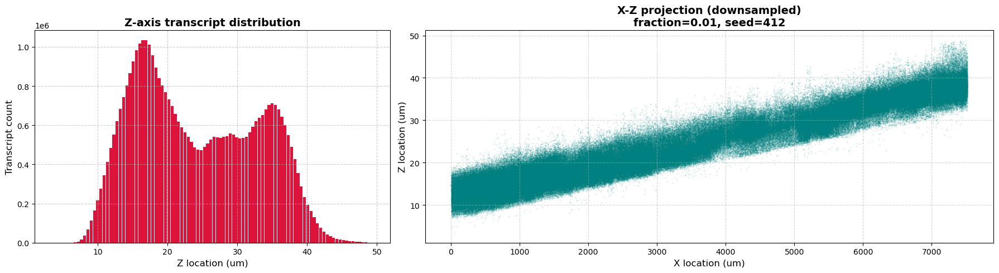

Z-axis profiling summary
Z range (um)               : 3.26 ~ 49.58
Histogram peak center (um) : 16.92
Max count per bin          : 1,032,561
Histogram bins             : 100


In [2]:
# %%
# ===========================================================================
# Z-axis distribution and X-Z projection
# Z 轴分布与 X-Z 投影
# ===========================================================================

import matplotlib.pyplot as plt
import numpy as np

# ---------------------------------------------------------------------------
# Z-axis extraction and histogram aggregation
# Z 轴提取与直方图汇总
# ---------------------------------------------------------------------------
# Summarize the distribution of z_location from post-QC transcripts (df).
# 使用 QC 后的转录本表（df）汇总 z_location 的分布。
z_um = df["z_location"]

z_min_um = float(z_um.min())
z_max_um = float(z_um.max())

# Use equal-width bins over the observed Z range.
# 在观测到的 Z 范围内使用等宽分箱。
N_Z_BINS = 100
z_edges = np.linspace(z_min_um, z_max_um, N_Z_BINS + 1)
z_counts, _ = np.histogram(z_um.to_numpy(), bins=z_edges)
z_centers = (z_edges[:-1] + z_edges[1:]) / 2.0

# ---------------------------------------------------------------------------
# Downsampling for visualization (X-Z projection)
# 用于可视化的下采样（X-Z 投影）
# ---------------------------------------------------------------------------
# Sampling is applied only to scatter plotting.
# 下采样仅用于散点图绘制。
PLOT_SAMPLE_FRACTION = 0.01
PLOT_SAMPLE_SEED = 412

plot_df = df.sample(fraction=PLOT_SAMPLE_FRACTION, seed=PLOT_SAMPLE_SEED)
x_um = plot_df["x_location"].to_numpy()
z_plot_um = plot_df["z_location"].to_numpy()

# ---------------------------------------------------------------------------
# Visualization
# 可视化
# ---------------------------------------------------------------------------
fig, (ax_hist, ax_xz) = plt.subplots(
    1,
    2,
    figsize=(18, 5),
    gridspec_kw={"width_ratios": [1, 1.6]},
)

ax_hist.bar(
    z_centers,
    z_counts,
    width=(z_edges[1] - z_edges[0]) * 0.9,
    color="crimson",
    edgecolor="none",
)
ax_hist.set_title("Z-axis transcript distribution", fontsize=14, fontweight="bold")
ax_hist.set_xlabel("Z location (um)", fontsize=12)
ax_hist.set_ylabel("Transcript count", fontsize=12)
ax_hist.grid(True, linestyle="--", alpha=0.6)

ax_xz.scatter(x_um, z_plot_um, s=0.1, alpha=0.3, color="teal")
ax_xz.set_title(
    f"X-Z projection (downsampled)\n"
    f"fraction={PLOT_SAMPLE_FRACTION}, seed={PLOT_SAMPLE_SEED}",
    fontsize=14,
    fontweight="bold",
)
ax_xz.set_xlabel("X location (um)", fontsize=12)
ax_xz.set_ylabel("Z location (um)", fontsize=12)
ax_xz.grid(True, linestyle="--", alpha=0.5)

plt.tight_layout()
plt.show()

# ---------------------------------------------------------------------------
# Z-axis summary statistics
# Z 轴汇总统计
# ---------------------------------------------------------------------------
peak_bin_idx = int(np.argmax(z_counts))
peak_z_um = float(z_centers[peak_bin_idx])
peak_bin_count = int(z_counts[peak_bin_idx])

print("=" * 55)
print("Z-axis profiling summary")
print("=" * 55)
print(f"Z range (um)               : {z_min_um:.2f} ~ {z_max_um:.2f}")
print(f"Histogram peak center (um) : {peak_z_um:.2f}")
print(f"Max count per bin          : {peak_bin_count:,}")
print(f"Histogram bins             : {N_Z_BINS}")
print("=" * 55)

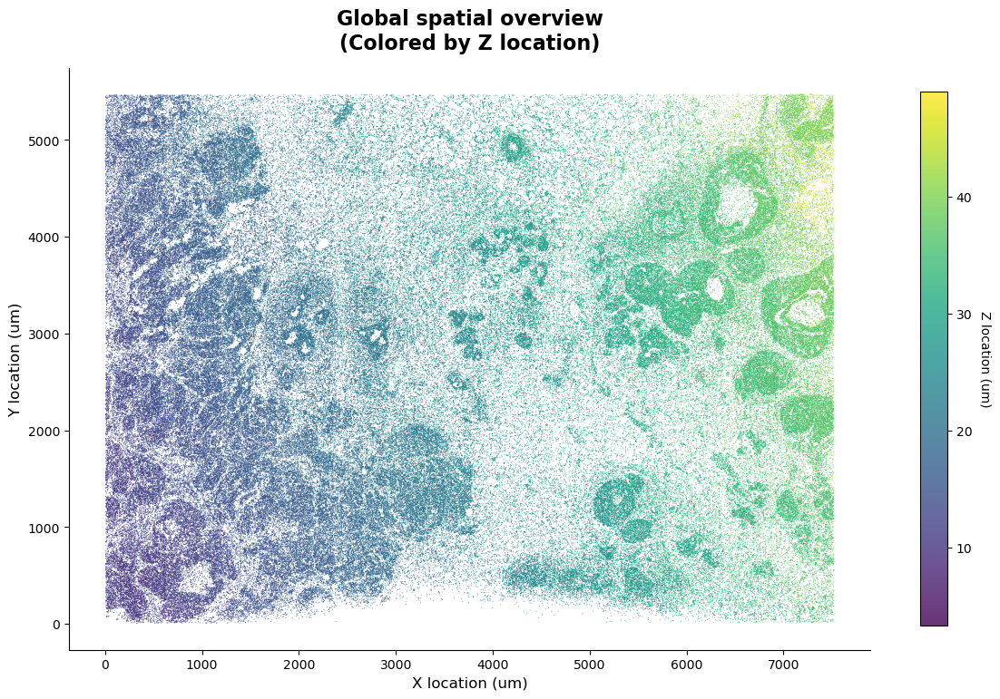

In [3]:
# %%
# ===========================================================================
# Global spatial overview (X-Y colored by Z)
# 全局空间概览（X-Y 以 Z 着色）
# ===========================================================================

import matplotlib.pyplot as plt

# Sampling is applied only to scatter plotting.
# 下采样仅用于散点图绘制。
PLOT_SAMPLE_FRACTION = 0.01
PLOT_SAMPLE_SEED = 412

plot_pd = df.sample(fraction=PLOT_SAMPLE_FRACTION, seed=PLOT_SAMPLE_SEED).to_pandas()

fig, ax = plt.subplots(figsize=(12, 8))

# Scatter plot of transcripts in X-Y, color-coded by Z coordinate.
# 转录本在 X-Y 平面的散点图，并按 Z 坐标着色。
sc = ax.scatter(
    plot_pd["x_location"],
    plot_pd["y_location"],
    c=plot_pd["z_location"],
    cmap="viridis",
    s=0.5,
    alpha=0.8,
    edgecolors="none",
    rasterized=True,  # Reduce output size for vector backends.
    # 对于矢量后端，用栅格化降低输出体积。
)

ax.set_title(
    "Global spatial overview\n(Colored by Z location)",
    fontsize=16,
    fontweight="bold",
    pad=15,
)
ax.set_xlabel("X location (um)", fontsize=12)
ax.set_ylabel("Y location (um)", fontsize=12)

ax.set_aspect("equal")

cbar = plt.colorbar(sc, ax=ax, shrink=0.8)
cbar.set_label("Z location (um)", rotation=270, labelpad=15)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.tight_layout()
plt.show()

Aggregating grids (bin_size_um=10.0) and computing metrics (min_count=10, z_entropy_bins=100)...


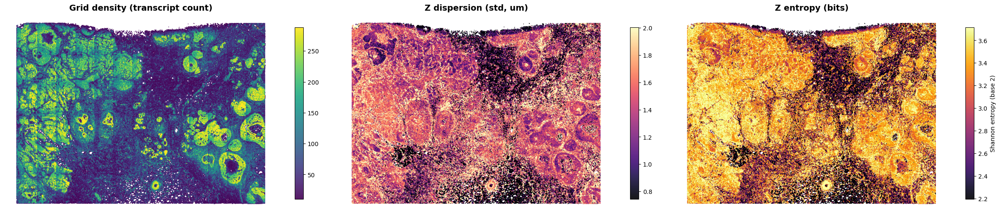

Spatial grid aggregation summary
Z entropy histogram bins   : 100
Total grids (after filters): 387,778
PCA on grid-level features
Features: ['transcript_count', 'z_stacking_index_um', 'z_entropy']

Explained variance ratio per component:
  PC1: 0.6588  (cumulative: 0.6588)
  PC2: 0.2873  (cumulative: 0.9461)
  PC3: 0.0539  (cumulative: 1.0000)

Component loadings (rows=PC, cols=features):
     transcript_count  z_stacking_index_um  z_entropy
PC1            0.4606               0.5716     0.6790
PC2            0.8045              -0.5920    -0.0474
PC3           -0.3749              -0.5682     0.7326


In [4]:
# %%
# ===========================================================================
# Spatial grid aggregation (density, Z dispersion, Z entropy)
# 空间网格聚合（密度、Z 离散度、Z 熵）
# ===========================================================================

import glob
import numpy as np
import matplotlib.pyplot as plt
import polars as pl
import tifffile
import pandas as pd

# ---------------------------------------------------------------------------
# H&E whole-slide image (WSI) visualization
# H&E 全视野图像（WSI）可视化
# ---------------------------------------------------------------------------
# This section is not modified in this refactor.
# 该部分在本次重构中不改动。

# ---------------------------------------------------------------------------
# Grid binning and metric aggregation (Polars)
# 网格分箱与指标聚合（Polars）
# ---------------------------------------------------------------------------
BIN_SIZE_UM = float(globals().get("BIN_SIZE_UM", 20.0))
MIN_TRANSCRIPTS_PER_GRID = 10

# Entropy histogram definition (dataset-level edges).
# 熵直方图定义（数据集层面的分箱边界）。
Z_ENTROPY_HIST_BINS = 100
MIN_Z_FOR_ENTROPY = 10

print(
    f"Aggregating grids (bin_size_um={BIN_SIZE_UM}) and computing metrics "
    f"(min_count={MIN_TRANSCRIPTS_PER_GRID}, z_entropy_bins={Z_ENTROPY_HIST_BINS})..."
)

z_min_um = float(df["z_location"].min())
z_max_um = float(df["z_location"].max())
z_edges = np.linspace(z_min_um, z_max_um, int(Z_ENTROPY_HIST_BINS) + 1).astype(float)

grid_lf = (
    df.lazy()
    .with_columns(
        (pl.col("x_location") / BIN_SIZE_UM).floor().cast(pl.Int32).alias("x_bin"),
        (pl.col("y_location") / BIN_SIZE_UM).floor().cast(pl.Int32).alias("y_bin"),
        pl.col("z_location").cast(pl.Float64).alias("z_um"),
    )
    .group_by(["x_bin", "y_bin"])
    .agg(
        pl.len().alias("transcript_count"),
        pl.col("z_um").std().alias("z_stacking_index_um"),
        pl.col("z_um").alias("z_values"),
    )
    .filter(pl.col("transcript_count") >= MIN_TRANSCRIPTS_PER_GRID)
    .with_columns(
        (pl.col("x_bin") * BIN_SIZE_UM + (BIN_SIZE_UM / 2.0)).alias("x_um"),
        (pl.col("y_bin") * BIN_SIZE_UM + (BIN_SIZE_UM / 2.0)).alias("y_um"),
    )
)

grid_pd = grid_lf.collect().to_pandas()

# ---------------------------------------------------------------------------
# Z entropy computation (NumPy, batch-oriented)
# Z 熵计算（NumPy，批处理）
# ---------------------------------------------------------------------------
# Shannon entropy is computed on a fixed histogram per grid.
# 对每个网格使用固定分箱直方图计算香农熵。
def shannon_entropy_from_hist(counts: np.ndarray) -> float:
    """
    Shannon entropy in bits from histogram counts.
    由直方图计数计算以 bit 为单位的香农熵。
    """
    total = float(np.sum(counts))
    if total <= 0:
        return np.nan
    p = counts.astype(float) / total
    p = p[p > 0]
    if p.size == 0:
        return np.nan
    return float(-np.sum(p * np.log2(p)))

z_lists = grid_pd["z_values"].to_list()
z_entropy = np.full(len(z_lists), np.nan, dtype=float)

for i, z in enumerate(z_lists):
    if z is None:
        continue
    z_arr = np.asarray(z, dtype=float)
    z_arr = z_arr[np.isfinite(z_arr)]
    if z_arr.size < MIN_Z_FOR_ENTROPY:
        continue
    counts, _ = np.histogram(z_arr, bins=z_edges, density=False)
    z_entropy[i] = shannon_entropy_from_hist(counts)

grid_pd["z_entropy"] = z_entropy
grid_pd = grid_pd.drop(columns=["z_values"])
grid_pd = grid_pd.dropna(subset=["z_stacking_index_um", "z_entropy"]).copy()

# ---------------------------------------------------------------------------
# Visualization
# 可视化
# ---------------------------------------------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(24, 7))
ax_den, ax_zstd, ax_zent = axes

DENSITY_VMAX = grid_pd["transcript_count"].quantile(0.98)
ZSTD_VMIN = grid_pd["z_stacking_index_um"].quantile(0.10)
ZSTD_VMAX = grid_pd["z_stacking_index_um"].quantile(0.90)
ZENT_VMIN = grid_pd["z_entropy"].quantile(0.10)
ZENT_VMAX = grid_pd["z_entropy"].quantile(0.90)

sc1 = ax_den.scatter(
    grid_pd["x_um"],
    grid_pd["y_um"],
    c=grid_pd["transcript_count"],
    s=1.5,
    cmap="viridis",
    alpha=0.9,
    edgecolors="none",
    vmax=DENSITY_VMAX,
    rasterized=True,
)
ax_den.set_title("Grid density (transcript count)", fontsize=14, fontweight="bold")
plt.colorbar(sc1, ax=ax_den, shrink=0.6)

sc2 = ax_zstd.scatter(
    grid_pd["x_um"],
    grid_pd["y_um"],
    c=grid_pd["z_stacking_index_um"],
    s=1.5,
    cmap="magma",
    alpha=0.9,
    edgecolors="none",
    vmin=ZSTD_VMIN,
    vmax=ZSTD_VMAX,
    rasterized=True,
)
ax_zstd.set_title("Z dispersion (std, um)", fontsize=14, fontweight="bold")
plt.colorbar(sc2, ax=ax_zstd, shrink=0.6)

sc3 = ax_zent.scatter(
    grid_pd["x_um"],
    grid_pd["y_um"],
    c=grid_pd["z_entropy"],
    s=1.5,
    cmap="inferno",
    alpha=0.9,
    edgecolors="none",
    vmin=ZENT_VMIN,
    vmax=ZENT_VMAX,
    rasterized=True,
)
ax_zent.set_title("Z entropy (bits)", fontsize=14, fontweight="bold")
plt.colorbar(sc3, ax=ax_zent, shrink=0.6, label="Shannon entropy (base 2)")

for ax in axes:
    ax.set_aspect("equal")
    ax.invert_yaxis()
    ax.axis("off")

plt.tight_layout()
plt.show()

# ---------------------------------------------------------------------------
# Correlation summary
# 相关性汇总
# ---------------------------------------------------------------------------

print("=" * 55)
print("Spatial grid aggregation summary")
print("=" * 55)
print(f"Z entropy histogram bins   : {Z_ENTROPY_HIST_BINS}")
print(f"Total grids (after filters): {len(grid_pd):,}")

print("=" * 55)

# ---------------------------------------------------------------------------
# PCA on grid-level features (density, Z dispersion, Z entropy)
# 网格级特征的主成分分析（密度、Z 离散度、Z 熵）
# ---------------------------------------------------------------------------
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

pca_features = ["transcript_count", "z_stacking_index_um", "z_entropy"]
X_pca = grid_pd[pca_features].to_numpy(float)

# Standardize before PCA (features have different scales).
# PCA 前做标准化（各特征量纲不同）。
X_pca_scaled = StandardScaler().fit_transform(X_pca)

pca = PCA(n_components=len(pca_features))
pca.fit(X_pca_scaled)

print("=" * 55)
print("PCA on grid-level features")
print("=" * 55)
print(f"Features: {pca_features}")
print()
print("Explained variance ratio per component:")
for i, (ratio, cumul) in enumerate(
    zip(pca.explained_variance_ratio_, np.cumsum(pca.explained_variance_ratio_))
):
    print(f"  PC{i + 1}: {ratio:.4f}  (cumulative: {cumul:.4f})")
print()
print("Component loadings (rows=PC, cols=features):")
loadings = pd.DataFrame(
    pca.components_,
    columns=pca_features,
    index=[f"PC{i + 1}" for i in range(len(pca_features))],
)
print(loadings.round(4).to_string())
print("=" * 55)

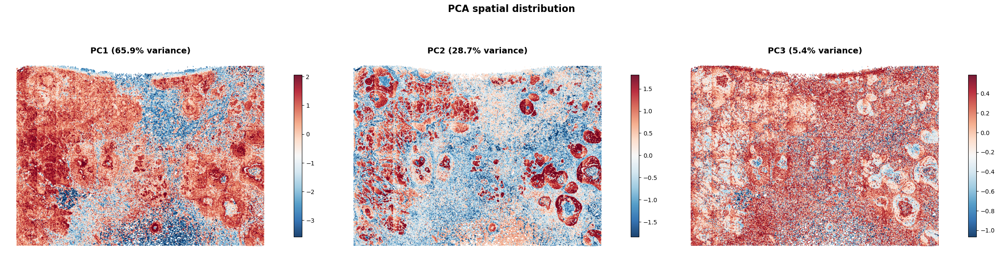

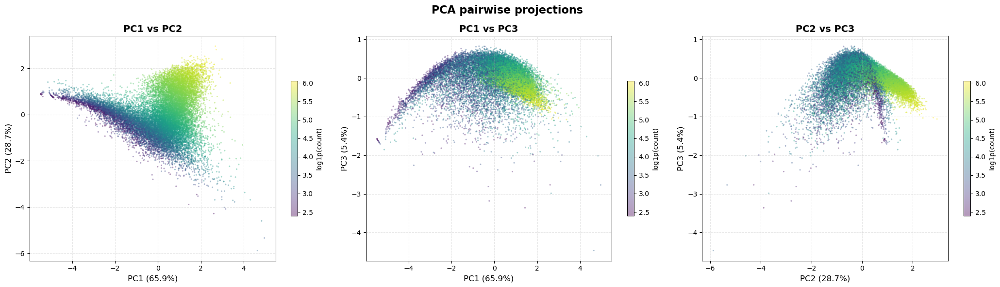

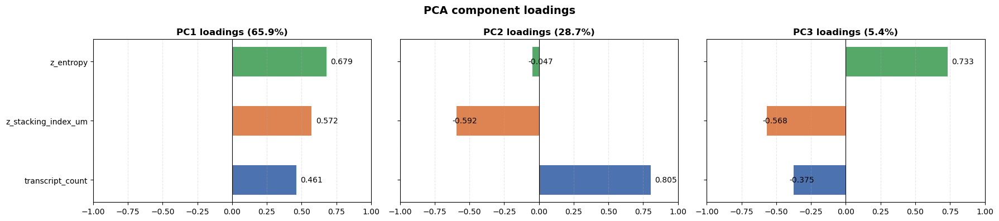

In [5]:
# ---------------------------------------------------------------------------
# PCA visualization
# PCA 可视化
# ---------------------------------------------------------------------------
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

pca_features = ["transcript_count", "z_stacking_index_um", "z_entropy"]
X_pca = grid_pd[pca_features].to_numpy(float)
X_pca_scaled = StandardScaler().fit_transform(X_pca)

pca = PCA(n_components=len(pca_features))
pcs = pca.fit_transform(X_pca_scaled)

grid_pd["PC1"] = pcs[:, 0]
grid_pd["PC2"] = pcs[:, 1]
grid_pd["PC3"] = pcs[:, 2]

evr = pca.explained_variance_ratio_

# ---------------------------------------------------------------------------
# Spatial maps of PC1, PC2, PC3
# PC1、PC2、PC3 的空间分布图
# ---------------------------------------------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(24, 7))

for i, (ax, pc_col) in enumerate(zip(axes, ["PC1", "PC2", "PC3"])):
    vals = grid_pd[pc_col].to_numpy(float)
    vmin, vmax = np.percentile(vals[np.isfinite(vals)], [2, 98])

    sc = ax.scatter(
        grid_pd["x_um"],
        grid_pd["y_um"],
        c=vals,
        s=1.5,
        cmap="RdBu_r",
        alpha=0.9,
        edgecolors="none",
        vmin=vmin,
        vmax=vmax,
        rasterized=True,
    )
    ax.set_title(
        f"{pc_col} ({evr[i]:.1%} variance)",
        fontsize=14,
        fontweight="bold",
    )
    ax.set_aspect("equal")
    ax.invert_yaxis()
    ax.axis("off")
    plt.colorbar(sc, ax=ax, shrink=0.6)

plt.suptitle("PCA spatial distribution", fontsize=16, fontweight="bold")
plt.tight_layout()
plt.show()

# ---------------------------------------------------------------------------
# Pairwise scatter: PC1 vs PC2, PC1 vs PC3, PC2 vs PC3
# 两两散点图：PC1 vs PC2、PC1 vs PC3、PC2 vs PC3
# ---------------------------------------------------------------------------
# Downsample for scatter readability.
# 为散点图可读性做下采样。
SCATTER_N = min(20000, len(grid_pd))
plot_sub = grid_pd.sample(n=SCATTER_N, random_state=42)

# Color by cluster if available, otherwise by transcript_count.
# 若有聚类标签则按聚类着色，否则按 transcript_count 着色。
has_cluster = "region" in plot_sub.columns and plot_sub["region"].nunique() > 1

pairs = [("PC1", "PC2"), ("PC1", "PC3"), ("PC2", "PC3")]

fig, axes = plt.subplots(1, 3, figsize=(21, 6))

for ax, (px, py) in zip(axes, pairs):
    if has_cluster:
        regions = sorted(plot_sub["region"].unique())
        palette = ctx.get("palette_region", None) if "ctx" in dir() else None
        for reg in regions:
            sub = plot_sub[plot_sub["region"] == reg]
            color = palette[reg] if palette and reg in palette else None
            ax.scatter(
                sub[px], sub[py],
                s=5, alpha=0.4, edgecolors="none",
                label=reg, c=[color] * len(sub) if color else None,
                rasterized=True,
            )
        ax.legend(markerscale=3, fontsize=9, frameon=False, loc="best")
    else:
        sc = ax.scatter(
            plot_sub[px], plot_sub[py],
            c=np.log1p(plot_sub["transcript_count"]),
            s=5, alpha=0.4, cmap="viridis", edgecolors="none",
            rasterized=True,
        )
        plt.colorbar(sc, ax=ax, shrink=0.6, label="log1p(count)")

    ix = int(px[-1]) - 1
    iy = int(py[-1]) - 1
    ax.set_xlabel(f"{px} ({evr[ix]:.1%})", fontsize=12)
    ax.set_ylabel(f"{py} ({evr[iy]:.1%})", fontsize=12)
    ax.set_title(f"{px} vs {py}", fontsize=14, fontweight="bold")
    ax.grid(True, ls="--", alpha=0.3)

plt.suptitle("PCA pairwise projections", fontsize=16, fontweight="bold")
plt.tight_layout()
plt.show()

# ---------------------------------------------------------------------------
# Loadings bar chart
# 载荷条形图
# ---------------------------------------------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(18, 4), sharey=True)

colors = ["#4C72B0", "#DD8452", "#55A868"]

for i, ax in enumerate(axes):
    loadings = pca.components_[i]
    bars = ax.barh(pca_features, loadings, color=colors, edgecolor="none", height=0.5)
    ax.axvline(0, color="black", lw=0.8)
    ax.set_title(f"PC{i + 1} loadings ({evr[i]:.1%})", fontsize=12, fontweight="bold")
    ax.set_xlim(-1, 1)
    ax.grid(True, axis="x", ls="--", alpha=0.3)

    for bar, val in zip(bars, loadings):
        ax.text(
            val + 0.03 * np.sign(val), bar.get_y() + bar.get_height() / 2,
            f"{val:.3f}", va="center", fontsize=10,
        )

plt.suptitle("PCA component loadings", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

Running GMM (k=6) on features: log_density, z_std
GMM clustering completed: k=6
Features: log_density, z_std
------------------------------------------------------------
Cluster medians:
           transcript_count  z_stacking_index_um  z_entropy
region                                                     
Cluster 0              29.0             0.603416   2.085275
Cluster 1              32.0             1.588344   2.984234
Cluster 2              53.0             2.406173   3.511093
Cluster 3              61.0             1.200438   3.045696
Cluster 4              98.0             1.695740   3.552557
Cluster 5             209.0             1.414887   3.480796


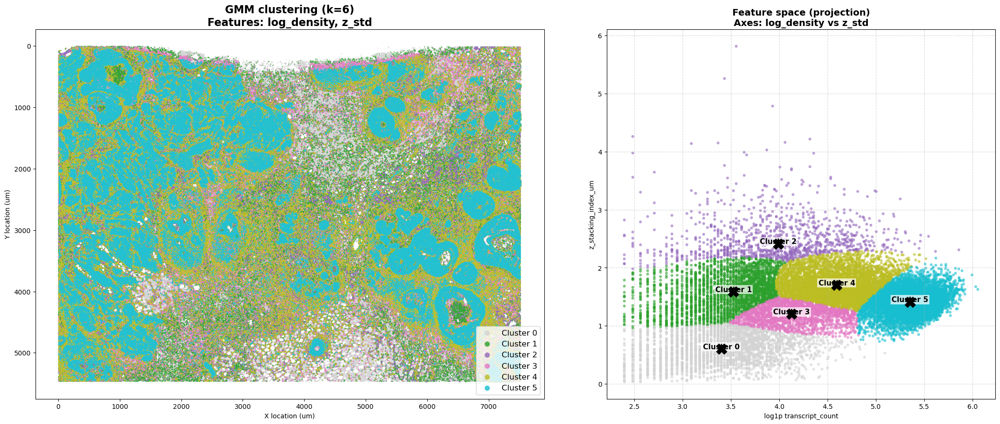

In [6]:
# %%
# ===========================================================================
# GMM clustering on grid-level features
# 基于网格特征的 GMM 聚类
# ===========================================================================

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import cm
from matplotlib.colors import LinearSegmentedColormap
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler

# ---------------------------------------------------------------------------
# Configuration
# 配置
# ---------------------------------------------------------------------------
N_COMPONENTS = 6
RANDOM_SEED = 412

# Feature selection for GMM.
# GMM 使用的特征选择。
# Supported keys: "log_density", "z_std", "z_entropy"
# 可用键： "log_density", "z_std", "z_entropy"
GMM_FEATURE_KEYS = ("log_density", "z_std")

# Default compare pair uses the last two clusters after sorting by transcript_count.
# 默认对比组使用按 transcript_count 排序后的最后两个簇。
COMPARE_CLUSTER_A = N_COMPONENTS - 2
COMPARE_CLUSTER_B = N_COMPONENTS - 1

# ---------------------------------------------------------------------------
# Input checks
# 输入检查
# ---------------------------------------------------------------------------
required_cols = {"transcript_count", "x_um", "y_um"}
missing = required_cols - set(grid_pd.columns)
if missing:
    raise ValueError(f"grid_pd missing required columns: {sorted(missing)}")

z_std_col = "z_stacking_index_um" if "z_stacking_index_um" in grid_pd.columns else "z_stacking_index"
if z_std_col not in grid_pd.columns:
    raise ValueError("grid_pd missing z dispersion column (z_stacking_index_um or z_stacking_index)")

x_col, y_col = "x_um", "y_um"

feature_defs = {
    "log_density": ("transcript_count", lambda d: np.log1p(d["transcript_count"].to_numpy(float))),
    "z_std": (z_std_col, lambda d: d[z_std_col].to_numpy(float)),
    "z_entropy": ("z_entropy", lambda d: d["z_entropy"].to_numpy(float)),
}

unknown_keys = sorted(set(GMM_FEATURE_KEYS) - set(feature_defs))
if unknown_keys:
    raise ValueError(f"Unknown feature keys in GMM_FEATURE_KEYS: {unknown_keys}")

# Ensure required raw columns for selected features exist.
# 检查所选特征所需的原始列是否存在。
need_cols = {feature_defs[k][0] for k in GMM_FEATURE_KEYS}
missing_feature_cols = need_cols - set(grid_pd.columns)
if missing_feature_cols:
    raise ValueError(f"grid_pd missing feature columns for GMM: {sorted(missing_feature_cols)}")

# ---------------------------------------------------------------------------
# Feature matrix construction
# 特征矩阵构建
# ---------------------------------------------------------------------------
feature_values = {}
for k in GMM_FEATURE_KEYS:
    _, fn = feature_defs[k]
    feature_values[k] = fn(grid_pd)

X = np.column_stack([feature_values[k] for k in GMM_FEATURE_KEYS]).astype(float)

valid = np.all(np.isfinite(X), axis=1)
if int(valid.sum()) == 0:
    raise ValueError("No valid rows for GMM after filtering non-finite feature values")

X_valid = X[valid, :]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_valid)

print(f"Running GMM (k={N_COMPONENTS}) on features: {', '.join(GMM_FEATURE_KEYS)}")
gmm = GaussianMixture(
    n_components=int(N_COMPONENTS),
    random_state=int(RANDOM_SEED),
    covariance_type="full",
)
labels_raw = np.full(len(grid_pd), fill_value=-1, dtype=int)
labels_raw[valid] = gmm.fit_predict(X_scaled)
grid_pd["cluster_id_raw"] = labels_raw

# Keep only rows used in clustering for downstream region labeling.
# 仅对参与聚类的行进行后续区域标注。
clustered = grid_pd.loc[grid_pd["cluster_id_raw"] >= 0].copy()
if clustered.empty:
    raise ValueError("No clustered rows available for region labeling")

# Sort clusters by transcript_count median to get stable ordering.
# 按 transcript_count 的中位数对簇排序，以获得稳定编号。
rank = clustered.groupby("cluster_id_raw")["transcript_count"].median().sort_values()
map_id = {int(old): int(new) for new, old in enumerate(rank.index)}

grid_pd["cluster_sorted"] = (
    grid_pd["cluster_id_raw"].map(lambda v: map_id.get(int(v), -1) if v >= 0 else -1).astype(int)
)
grid_pd["region"] = np.where(
    grid_pd["cluster_sorted"] >= 0,
    "Cluster " + grid_pd["cluster_sorted"].astype(str),
    "Unassigned",
)

# ---------------------------------------------------------------------------
# Color palettes and compare context
# 配色与对比上下文
# ---------------------------------------------------------------------------
cmap = cm.get_cmap("tab10", int(N_COMPONENTS))
GMM_CLUSTER_PALETTE = {i: ("lightgray" if i == 0 else cmap(i)) for i in range(int(N_COMPONENTS))}
GMM_REGION_PALETTE = {f"Cluster {i}": c for i, c in GMM_CLUSTER_PALETTE.items()}

valid_clusters = sorted([c for c in grid_pd["cluster_sorted"].unique().tolist() if int(c) >= 0])
if len(valid_clusters) < 2:
    raise ValueError("Need at least two clusters for compare context")

if COMPARE_CLUSTER_A not in valid_clusters:
    COMPARE_CLUSTER_A = valid_clusters[-2]
if COMPARE_CLUSTER_B not in valid_clusters:
    COMPARE_CLUSTER_B = valid_clusters[-1]

COMPARE_COLOR_A = GMM_CLUSTER_PALETTE[int(COMPARE_CLUSTER_A)]
COMPARE_COLOR_B = GMM_CLUSTER_PALETTE[int(COMPARE_CLUSTER_B)]
COMPARE_CMAP_AB = LinearSegmentedColormap.from_list(
    "compare_ab",
    [COMPARE_COLOR_B, "#f7f7f7", COMPARE_COLOR_A],
)

def get_compare_context():
    """
    Return naming and color configuration for a selected compare pair.
    返回所选对比簇的命名与配色配置。
    """
    a, b = int(COMPARE_CLUSTER_A), int(COMPARE_CLUSTER_B)
    return {
        "cluster_a": a,
        "cluster_b": b,
        "region_a": f"Cluster {a}",
        "region_b": f"Cluster {b}",
        "group_a": f"Cluster_{a}_Group",
        "group_b": f"Cluster_{b}_Group",
        "cpm_col_a": f"Cluster_{a}_Group_CPM",
        "cpm_col_b": f"Cluster_{b}_Group_CPM",
        "color_a": GMM_CLUSTER_PALETTE[a],
        "color_b": GMM_CLUSTER_PALETTE[b],
        "palette_cluster": GMM_CLUSTER_PALETTE,
        "palette_region": GMM_REGION_PALETTE,
        "cmap_ab": COMPARE_CMAP_AB,
        "gmm_feature_keys": tuple(GMM_FEATURE_KEYS),
    }

COMPARE_CONTEXT = get_compare_context()
target_grids = grid_pd.copy()

# ---------------------------------------------------------------------------
# Statistics summary
# 统计汇总
# ---------------------------------------------------------------------------
summary_cols = ["transcript_count", z_std_col]
if "z_entropy" in grid_pd.columns:
    summary_cols.append("z_entropy")

stats_df = (
    grid_pd.loc[grid_pd["cluster_sorted"] >= 0]
    .groupby("region")[summary_cols]
    .median()
)

print("=" * 60)
print(f"GMM clustering completed: k={N_COMPONENTS}")
print(f"Features: {', '.join(GMM_FEATURE_KEYS)}")
print("-" * 60)
print("Cluster medians:")
print(stats_df)
print("=" * 60)

# ---------------------------------------------------------------------------
# Visualization
# 可视化
# ---------------------------------------------------------------------------
fig, (ax0, ax1) = plt.subplots(
    1,
    2,
    figsize=(22, 9),
    gridspec_kw={"width_ratios": [1.5, 1]},
)

labels = [f"Cluster {i}" for i in valid_clusters]

for lab in labels:
    sub = grid_pd[grid_pd["region"] == lab]
    ax0.scatter(
        sub[x_col],
        sub[y_col],
        s=2.5,
        c=[GMM_REGION_PALETTE[lab]] * len(sub),
        alpha=0.8,
        edgecolors="none",
        label=lab,
        rasterized=True,
    )

ax0.set_title(
    f"GMM clustering (k={N_COMPONENTS})\nFeatures: {', '.join(GMM_FEATURE_KEYS)}",
    fontsize=16,
    fontweight="bold",
)
ax0.set_xlabel("X location (um)")
ax0.set_ylabel("Y location (um)")
if grid_pd[y_col].max() > 0:
    ax0.invert_yaxis()
ax0.legend(markerscale=5, loc="lower right", fontsize=12, frameon=True)
ax0.set_aspect("equal")

# Feature-space plot: use the first two selected features for axes.
# 特征空间作图：使用所选特征的前两个作为坐标轴。
if len(GMM_FEATURE_KEYS) >= 2:
    plot_df = grid_pd.loc[grid_pd["cluster_sorted"] >= 0].sample(
        n=min(20000, int((grid_pd["cluster_sorted"] >= 0).sum())),
        random_state=42,
    )

    xk, yk = GMM_FEATURE_KEYS[0], GMM_FEATURE_KEYS[1]
    axis_map = {
        "log_density": ("log1p transcript_count", np.log1p(plot_df["transcript_count"].to_numpy(float))),
        "z_std": (z_std_col, plot_df[z_std_col].to_numpy(float)),
        "z_entropy": ("z_entropy", plot_df["z_entropy"].to_numpy(float)),
    }

    x_label, x_val = axis_map[xk]
    y_label, y_val = axis_map[yk]
    plot_df = plot_df.copy()
    plot_df["_x"] = x_val
    plot_df["_y"] = y_val

    sns.scatterplot(
        data=plot_df,
        x="_x",
        y="_y",
        hue="region",
        hue_order=labels,
        palette=GMM_REGION_PALETTE,
        s=15,
        alpha=0.6,
        ax=ax1,
        legend=False,
        edgecolor=None,
    )

    cent = plot_df.groupby("region")[["_x", "_y"]].median()
    for lab, row in cent.iterrows():
        ax1.scatter(row["_x"], row["_y"], s=250, c="black", marker="X", zorder=10)
        ax1.text(
            row["_x"],
            row["_y"],
            lab,
            ha="center",
            fontsize=11,
            fontweight="bold",
            bbox=dict(facecolor="white", alpha=0.7, edgecolor="none", pad=1.5),
        )

    ax1.set_title(
        f"Feature space (projection)\nAxes: {xk} vs {yk}",
        fontsize=14,
        fontweight="bold",
    )
    ax1.set_xlabel(x_label)
    ax1.set_ylabel(y_label)
    ax1.grid(True, linestyle="--", alpha=0.5, which="both")
else:
    ax1.axis("off")

plt.tight_layout()
plt.show()

In [8]:
# %%
# ===========================================================================
# Grid-level count matrix, marker ranking, and differential expression
# 网格级计数矩阵、标记基因排序与差异表达
# ===========================================================================

import warnings
import numpy as np
import pandas as pd
import polars as pl
from scipy import stats
from statsmodels.stats.multitest import multipletests

warnings.filterwarnings("ignore")

# ---------------------------------------------------------------------------
# Configuration
# 配置
# ---------------------------------------------------------------------------
ctx = get_compare_context()
CLUSTER_A, CLUSTER_B = ctx["cluster_a"], ctx["cluster_b"]
GROUP_A, GROUP_B = ctx["group_a"], ctx["group_b"]
CPM_COL_A, CPM_COL_B = ctx["cpm_col_a"], ctx["cpm_col_b"]

MARKER_TOP_N = 20

DISPLAY_LFC_THRESHOLD = 1.0
DISPLAY_PCT_THRESHOLD = 0.20
DISPLAY_FDR_THRESHOLD = 0.05

DGE_FC_THRESHOLD = 0.25
DGE_MEAN_CPM_THRESHOLD = 5.0
DGE_Q_THRESHOLD = 0.05

PSEUDOCOUNT = 1.0

# ---------------------------------------------------------------------------
# Grid count matrix construction (all clustered grids)
# 网格计数矩阵构建（覆盖所有已聚类网格）
# ---------------------------------------------------------------------------
print("=" * 70)
print("Building grid-level count matrix and CPM")
print("=" * 70)

valid_grids = grid_pd.loc[grid_pd["cluster_sorted"] >= 0, ["x_bin", "y_bin", "cluster_sorted", "region"]].copy()

if "df_binned" not in globals():
    df_binned = df.with_columns(
        (pl.col("x_location") / BIN_SIZE_UM).floor().cast(pl.Int32).alias("x_bin"),
        (pl.col("y_location") / BIN_SIZE_UM).floor().cast(pl.Int32).alias("y_bin"),
    )

df_binned_lf = df_binned.lazy() if isinstance(df_binned, pl.DataFrame) else df_binned
valid_grids_pl = pl.from_pandas(valid_grids[["x_bin", "y_bin", "cluster_sorted"]])

counts_all = (
    df_binned_lf
    .join(valid_grids_pl.lazy(), on=["x_bin", "y_bin"], how="inner")
    .group_by(["x_bin", "y_bin", "cluster_sorted", "feature_name"])
    .agg(pl.len().alias("count"))
    .collect()
    .to_pandas()
)

grid_matrix = (
    counts_all
    .pivot(index=["x_bin", "y_bin", "cluster_sorted"], columns="feature_name", values="count")
    .fillna(0)
)

lib_size = grid_matrix.sum(axis=1)
grid_cpm = grid_matrix.div(lib_size.replace(0, np.nan), axis=0).fillna(0) * 1e6

n_grids = len(grid_matrix)
n_genes = grid_matrix.shape[1]
gene_names = grid_matrix.columns.tolist()
print(f"Grid matrix: {n_grids:,} grids x {n_genes:,} genes")

# ---------------------------------------------------------------------------
# Per-cluster marker ranking (vectorized Wilcoxon, one-vs-rest)
# 逐簇标记基因排序（向量化 Wilcoxon，一对其余）
# ---------------------------------------------------------------------------
print("-" * 70)
print(f"Running per-cluster marker ranking (method=Wilcoxon, top_n={MARKER_TOP_N})")
print("-" * 70)

cluster_ids = sorted(grid_matrix.index.get_level_values("cluster_sorted").unique().tolist())

grid_log1p = np.log1p(grid_cpm)

# Pre-extract numpy arrays for speed.
# 预提取 numpy 数组以加速。
grid_log1p_vals = grid_log1p.values
grid_cpm_vals = grid_cpm.values
grid_matrix_vals = grid_matrix.values
cluster_index = grid_matrix.index.get_level_values("cluster_sorted").values

marker_table_data = {}

for cid in cluster_ids:
    in_mask = cluster_index == cid
    out_mask = ~in_mask

    n_in = int(in_mask.sum())
    n_out = int(out_mask.sum())
    if n_in < 3 or n_out < 3:
        continue

    in_log1p = grid_log1p_vals[in_mask]   # (n_in, n_genes)
    out_log1p = grid_log1p_vals[out_mask]  # (n_out, n_genes)

    # Vectorized Mann-Whitney U across all genes at once.
    # 向量化 Mann-Whitney U，一次处理所有基因。
    _, p_vals = stats.mannwhitneyu(in_log1p, out_log1p, alternative="two-sided", axis=0)
    u_greater, _ = stats.mannwhitneyu(in_log1p, out_log1p, alternative="greater", axis=0)
    scores = (u_greater / (n_in * n_out) - 0.5) * 2.0

    # Vectorized means, log2FC, pct.
    # 向量化计算均值、log2FC、表达比例。
    cpm_in_mean = grid_cpm_vals[in_mask].mean(axis=0)
    cpm_out_mean = grid_cpm_vals[out_mask].mean(axis=0)
    log2fc = np.log2((cpm_in_mean + PSEUDOCOUNT) / (cpm_out_mean + PSEUDOCOUNT))
    pct = (grid_matrix_vals[in_mask] > 0).mean(axis=0)
    mean_log1p_in = in_log1p.mean(axis=0)
    mean_log1p_out = out_log1p.mean(axis=0)

    # Handle zero-variance genes: set p=1.0.
    # 处理零方差基因：p 设为 1.0。
    var_in = in_log1p.var(axis=0)
    var_out = out_log1p.var(axis=0)
    zero_var_mask = (var_in == 0.0) & (var_out == 0.0)
    p_vals[zero_var_mask] = 1.0

    cluster_df = pd.DataFrame({
        "gene": gene_names,
        "score": scores,
        "log2fc": log2fc,
        "pct": pct,
        "pval": p_vals,
        "mean_log1p_in": mean_log1p_in,
        "mean_log1p_out": mean_log1p_out,
    })

    _, qvals, _, _ = multipletests(cluster_df["pval"].fillna(1.0), method="fdr_bh")
    cluster_df["fdr"] = qvals
    cluster_df = cluster_df.sort_values("score", ascending=False).reset_index(drop=True)

    top = cluster_df.head(MARKER_TOP_N)
    formatted_rows = []
    for _, row in top.iterrows():
        lfc_flag = f" [LFC>{DISPLAY_LFC_THRESHOLD}]" if row["log2fc"] > DISPLAY_LFC_THRESHOLD else ""
        pct_flag = f" [PCT>{DISPLAY_PCT_THRESHOLD}]" if row["pct"] > DISPLAY_PCT_THRESHOLD else ""
        fdr_flag = f" [FDR<{DISPLAY_FDR_THRESHOLD}]" if row["fdr"] < DISPLAY_FDR_THRESHOLD else ""

        row_text = (
            f"{row['gene']}{lfc_flag}{pct_flag}{fdr_flag}\n"
            f"(LFC:{row['log2fc']:.2f}, Score:{row['score']:.2f}, "
            f"PCT:{row['pct']:.2f}, FDR:{row['fdr']:.2e})"
        )
        formatted_rows.append(row_text)

    marker_table_data[f"Cluster {cid}"] = formatted_rows

df_markers = pd.DataFrame(marker_table_data)
df_markers.index = [f"Rank {i + 1}" for i in range(MARKER_TOP_N)]

pd.set_option("display.max_colwidth", None)
pd.set_option("display.width", 1000)
pd.set_option("display.max_columns", None)

print(f"Top {MARKER_TOP_N} markers per cluster (ordered by score)")
print(
    "Metrics: LFC=log2 fold change; Score=normalized U statistic; "
    "PCT=expression fraction in cluster; FDR=BH-adjusted p-value"
)
print(
    f"Flags: [LFC>{DISPLAY_LFC_THRESHOLD}], "
    f"[PCT>{DISPLAY_PCT_THRESHOLD}], "
    f"[FDR<{DISPLAY_FDR_THRESHOLD}] (display annotations)"
)
print("-" * 100)

try:
    from tabulate import tabulate
    print(
        tabulate(
            df_markers,
            headers="keys",
            tablefmt="grid",
            stralign="left",
            showindex=True,
            maxcolwidths=[None] * (len(df_markers.columns) + 1),
        )
    )
except ImportError:
    print(df_markers.to_string())

# ---------------------------------------------------------------------------
# Pairwise DGE between compare clusters (vectorized)
# 对比簇之间的差异表达（向量化）
# ---------------------------------------------------------------------------
print("=" * 70)
print(f"Pairwise DGE: {GROUP_A} vs {GROUP_B}")
print("=" * 70)

idx = grid_cpm.index.get_level_values("cluster_sorted")
cpm_a = grid_cpm.loc[idx == CLUSTER_A]
cpm_b = grid_cpm.loc[idx == CLUSTER_B]

if len(cpm_a) == 0 or len(cpm_b) == 0:
    raise ValueError(f"Empty compare groups: {GROUP_A}={len(cpm_a)}, {GROUP_B}={len(cpm_b)}")

print(f"Grid count: {GROUP_A}={len(cpm_a):,}, {GROUP_B}={len(cpm_b):,}")
print(f"Running Mann-Whitney U on {n_genes:,} genes...")

x_mat = cpm_a.values  # (n_a, n_genes)
y_mat = cpm_b.values  # (n_b, n_genes)

mean_a_arr = x_mat.mean(axis=0)
mean_b_arr = y_mat.mean(axis=0)
log2fc_arr = np.log2((mean_a_arr + PSEUDOCOUNT) / (mean_b_arr + PSEUDOCOUNT))

# Vectorized Mann-Whitney U.
# 向量化 Mann-Whitney U。
_, p_arr = stats.mannwhitneyu(x_mat, y_mat, alternative="two-sided", axis=0)

# Handle zero-variance genes.
# 处理零方差基因。
var_x = x_mat.var(axis=0)
var_y = y_mat.var(axis=0)
p_arr[(var_x == 0.0) & (var_y == 0.0)] = 1.0

dge_results = pd.DataFrame({
    CPM_COL_A: mean_a_arr,
    CPM_COL_B: mean_b_arr,
    "Mean_CPM": 0.5 * (mean_a_arr + mean_b_arr),
    "log2FC": log2fc_arr,
    "pval": p_arr,
}, index=gene_names)
dge_results.index.name = "feature_name"

_, qvals, _, _ = multipletests(dge_results["pval"].fillna(1.0), method="fdr_bh")
dge_results["qval"] = qvals
dge_results["nlog10_qval"] = -np.log10(dge_results["qval"] + 1e-300)

dge_results["is_stat_sig"] = dge_results["qval"] < DGE_Q_THRESHOLD
dge_results["is_practical_sig"] = (
    dge_results["is_stat_sig"]
    & (dge_results["log2FC"].abs() >= DGE_FC_THRESHOLD)
    & (dge_results["Mean_CPM"] >= DGE_MEAN_CPM_THRESHOLD)
)

grid_pd["dge_group"] = np.where(
    grid_pd["cluster_sorted"] == CLUSTER_A,
    GROUP_A,
    np.where(grid_pd["cluster_sorted"] == CLUSTER_B, GROUP_B, ""),
)

# ---------------------------------------------------------------------------
# DGE summary
# 差异表达汇总
# ---------------------------------------------------------------------------
dge_practical = dge_results.loc[dge_results["is_practical_sig"]].copy()
n_up = int((dge_practical["log2FC"] > 0).sum())
n_down = int((dge_practical["log2FC"] < 0).sum())

top_a = dge_practical.sort_values("log2FC", ascending=False).head(MARKER_TOP_N)
top_b = dge_practical.sort_values("log2FC", ascending=True).head(MARKER_TOP_N)

summary = (
    pd.concat([top_a, top_b])
    .reset_index()
    .drop_duplicates(subset=["feature_name"], keep="first")
)
summary["Direction"] = np.where(summary["log2FC"] > 0, GROUP_A, GROUP_B)
summary["q-value"] = summary["qval"].apply(
    lambda q: f"{q:.2e}" if q > 1e-300 else "< 1e-300"
)

dge_summary = summary[
    ["feature_name", "Direction", "log2FC", "Mean_CPM", CPM_COL_A, CPM_COL_B, "q-value"]
].rename(columns={"feature_name": "Gene"})

for c in ["log2FC", "Mean_CPM", CPM_COL_A, CPM_COL_B]:
    dge_summary[c] = dge_summary[c].round(2)

print(f"Thresholds: |log2FC| >= {DGE_FC_THRESHOLD}, Mean_CPM >= {DGE_MEAN_CPM_THRESHOLD}, FDR < {DGE_Q_THRESHOLD}")
print(f"Genes passing thresholds: {int(dge_results['is_practical_sig'].sum())} ({n_up} up in {GROUP_A}, {n_down} up in {GROUP_B})")
print("-" * 70)
print(f"Top markers for {GROUP_A}:")
if not top_a.empty:
    print(dge_summary.loc[dge_summary["Direction"] == GROUP_A].to_string(index=False))
else:
    print("  (none)")
print("-" * 70)
print(f"Top markers for {GROUP_B}:")
if not top_b.empty:
    print(dge_summary.loc[dge_summary["Direction"] == GROUP_B].to_string(index=False))
else:
    print("  (none)")
print("=" * 70)

Building grid-level count matrix and CPM
Grid matrix: 387,778 grids x 321 genes
----------------------------------------------------------------------
Running per-cluster marker ranking (method=Wilcoxon, top_n=20)
----------------------------------------------------------------------
Top 20 markers per cluster (ordered by score)
Metrics: LFC=log2 fold change; Score=normalized U statistic; PCT=expression fraction in cluster; FDR=BH-adjusted p-value
Flags: [LFC>1.0], [PCT>0.2], [FDR<0.05] (display annotations)
----------------------------------------------------------------------------------------------------
                                                                                       Cluster 0                                                                              Cluster 1                                                                    Cluster 2                                                                     Cluster 3                                               

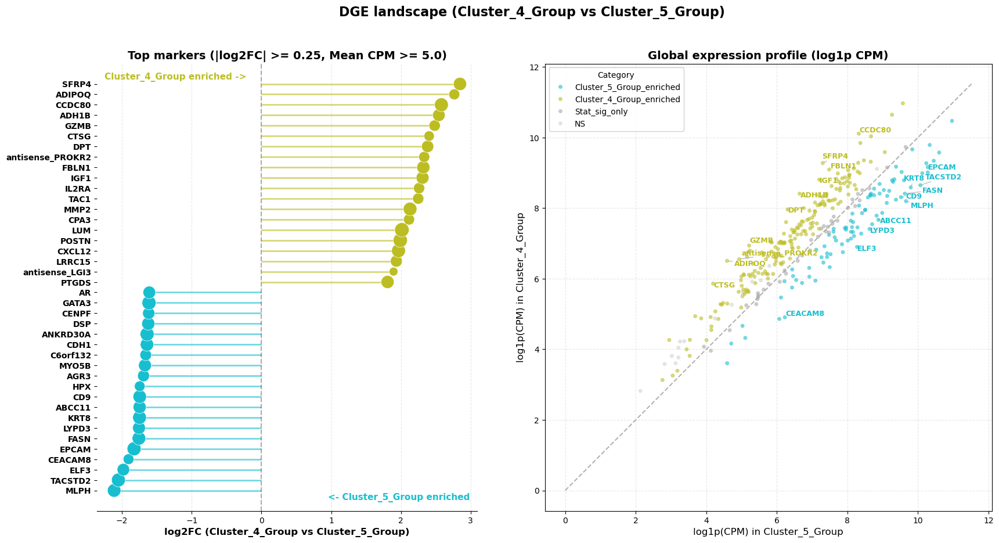

In [10]:
# %%
# ===========================================================================
# DGE visualization (lollipop + expression scatter)
# 差异表达可视化（棒棒糖图 + 表达散点图）
# ===========================================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from adjustText import adjust_text

# ---------------------------------------------------------------------------
# Context and thresholds
# 上下文与阈值
# ---------------------------------------------------------------------------
ctx = get_compare_context()
gA, gB = ctx["group_a"], ctx["group_b"]
cA, cB = ctx["color_a"], ctx["color_b"]
colA, colB = ctx["cpm_col_a"], ctx["cpm_col_b"]

# Visualization thresholds (should match or be looser than DGE thresholds).
# 可视化阈值（应与 DGE 阈值一致或更宽松）。
FC_THRESH_VIS = DGE_FC_THRESHOLD
MEAN_CPM_THRESH_VIS = DGE_MEAN_CPM_THRESHOLD
Q_THRESH_VIS = DGE_Q_THRESHOLD

# Number of top genes to show per direction.
# 每个方向展示的基因数。
TOP_N_VIS = 20

# Number of gene labels on scatter plot per direction.
# 散点图上每个方向标注的基因数。
LABEL_N_VIS = 10

# ---------------------------------------------------------------------------
# Input check
# 输入检查
# ---------------------------------------------------------------------------
req = {"log2FC", "qval", "Mean_CPM", colA, colB}
miss = req - set(dge_results.columns)
if miss:
    raise ValueError(f"dge_results missing columns: {sorted(miss)}")

# ---------------------------------------------------------------------------
# Gene categorization
# 基因分类
# ---------------------------------------------------------------------------
is_stat = dge_results["qval"] < Q_THRESH_VIS
is_eff = dge_results["log2FC"].abs() >= FC_THRESH_VIS
is_abund = dge_results["Mean_CPM"] >= MEAN_CPM_THRESH_VIS
is_prac = is_stat & is_eff & is_abund

catA = f"{gA}_enriched"
catB = f"{gB}_enriched"

cat = np.full(len(dge_results), "NS", dtype=object)
cat[is_stat.to_numpy()] = "Stat_sig_only"
cat[(is_prac & (dge_results["log2FC"] > 0)).to_numpy()] = catA
cat[(is_prac & (dge_results["log2FC"] < 0)).to_numpy()] = catB

dge_vis = dge_results.copy()
dge_vis["category"] = cat

topA = dge_vis.loc[dge_vis["category"] == catA].sort_values("log2FC", ascending=False).head(TOP_N_VIS)
topB = dge_vis.loc[dge_vis["category"] == catB].sort_values("log2FC", ascending=True).head(TOP_N_VIS)

plot_data = (
    pd.concat([topA, topB])
    .reset_index()
    .rename(columns={"feature_name": "Gene"})
    .sort_values("log2FC")
)

# ---------------------------------------------------------------------------
# Figure
# 作图
# ---------------------------------------------------------------------------
fig = plt.figure(figsize=(20, 10))
gs = fig.add_gridspec(1, 2, width_ratios=[1, 1.2], wspace=0.15)
ax0 = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[0, 1])

# Left: lollipop chart of top markers.
# 左：排名靠前的标记基因棒棒糖图。
if not plot_data.empty:
    y = np.arange(len(plot_data))
    colors = [cB if v < 0 else cA for v in plot_data["log2FC"]]

    ax0.hlines(y=y, xmin=0, xmax=plot_data["log2FC"], color=colors, alpha=0.6, linewidth=2)
    sizes = np.log1p(plot_data["Mean_CPM"]) * 30.0
    ax0.scatter(
        plot_data["log2FC"], y,
        color=colors, s=sizes, edgecolors="white", linewidth=0.5, zorder=3,
    )

    ax0.axvline(0, color="black", alpha=0.3, linestyle="--")
    ax0.set_yticks(y)
    ax0.set_yticklabels(plot_data["Gene"], fontsize=10, fontweight="bold")
    ax0.set_xlabel(f"log2FC ({gA} vs {gB})", fontsize=12, fontweight="bold")
    ax0.set_title(
        f"Top markers (|log2FC| >= {FC_THRESH_VIS}, Mean CPM >= {MEAN_CPM_THRESH_VIS})",
        fontsize=14,
        fontweight="bold",
    )

    ax0.text(0.02, 0.98, f"{gA} enriched ->", transform=ax0.transAxes, color=cA, ha="left", va="top", fontsize=11, fontweight="bold")
    ax0.text(0.98, 0.02, f"<- {gB} enriched", transform=ax0.transAxes, color=cB, ha="right", va="bottom", fontsize=11, fontweight="bold")

    for sp in ["top", "right", "left"]:
        ax0.spines[sp].set_visible(False)
    ax0.grid(axis="x", linestyle="--", alpha=0.3)
else:
    ax0.text(0.5, 0.5, "No genes passed thresholds", ha="center", va="center", fontsize=14)

# Right: scatter plot of mean CPM per group.
# 右：各组均值 CPM 散点图。
pdf = dge_vis.copy()
pdf["x_val"] = np.log1p(pdf[colB])
pdf["y_val"] = np.log1p(pdf[colA])

palette = {
    catA: cA,
    catB: cB,
    "Stat_sig_only": "darkgray",
    "NS": "lightgray",
}

sns.scatterplot(
    data=pdf, x="x_val", y="y_val", hue="category",
    palette=palette, s=20, alpha=0.6, edgecolor=None,
    ax=ax1, legend=True, rasterized=True,
)

lim = max(pdf["x_val"].max(), pdf["y_val"].max()) * 1.05
ax1.plot([0, lim], [0, lim], "k--", alpha=0.3, zorder=0)

texts = []
for _, row in topA.head(LABEL_N_VIS).iterrows():
    if row["Mean_CPM"] >= MEAN_CPM_THRESH_VIS:
        texts.append(ax1.text(np.log1p(row[colB]), np.log1p(row[colA]), row.name, color=cA, fontsize=9, fontweight="bold"))

for _, row in topB.head(LABEL_N_VIS).iterrows():
    if row["Mean_CPM"] >= MEAN_CPM_THRESH_VIS:
        texts.append(ax1.text(np.log1p(row[colB]), np.log1p(row[colA]), row.name, color=cB, fontsize=9, fontweight="bold"))

if texts:
    adjust_text(texts, ax=ax1, arrowprops=dict(arrowstyle="-", color="gray", alpha=0.5))

ax1.set_title("Global expression profile (log1p CPM)", fontsize=14, fontweight="bold")
ax1.set_xlabel(f"log1p(CPM) in {gB}", fontsize=12)
ax1.set_ylabel(f"log1p(CPM) in {gA}", fontsize=12)
ax1.legend(loc="upper left", fontsize=10, framealpha=0.9, title="Category")
ax1.grid(True, linestyle="--", alpha=0.3)
ax1.set_aspect("equal")

fig.suptitle(
    f"DGE landscape ({gA} vs {gB})",
    fontsize=16,
    fontweight="bold",
    y=0.98,
)
plt.tight_layout()
plt.show()

Tracking 17 genes across 8 scales
Compare: Cluster_4_Group vs Cluster_5_Group
  scale=10 um ... done
  scale=20 um ... done
  scale=30 um ... done
  scale=40 um ... done
  scale=50 um ... done
  scale=60 um ... done
  scale=80 um ... done
  scale=100 um ... done


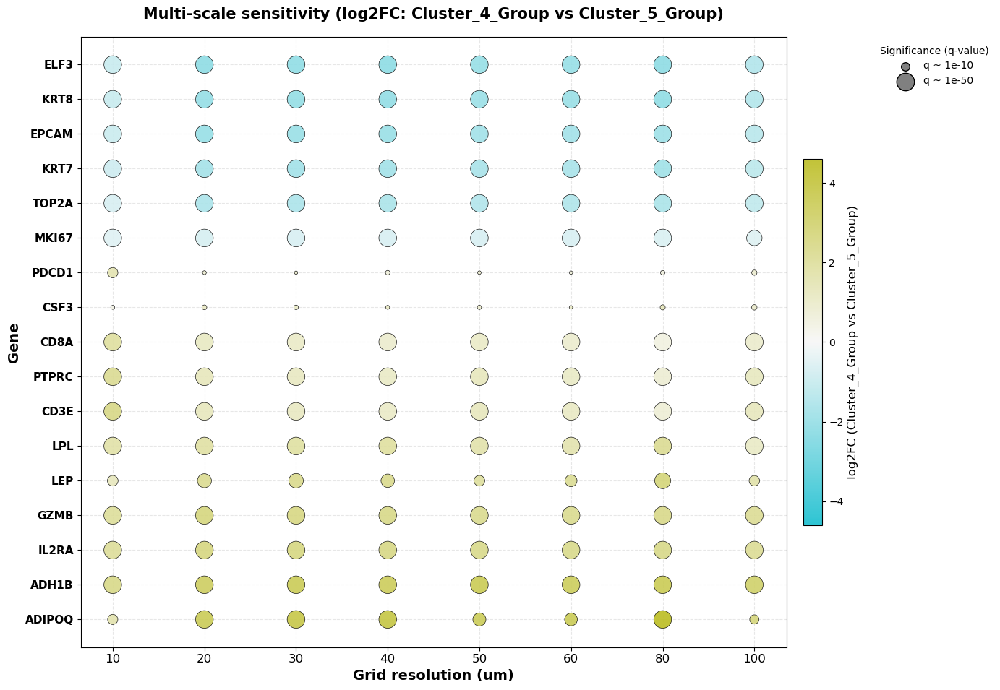

Multi-scale sensitivity analysis summary
Scales evaluated : [10, 20, 30, 40, 50, 60, 80, 100]
Genes tracked    : 17
Total comparisons: 136


In [22]:
# %%
# ===========================================================================
# Multi-scale sensitivity analysis
# 多尺度敏感性分析
# ===========================================================================

import numpy as np
import pandas as pd
import polars as pl
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from scipy import stats
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.multitest import multipletests

# ---------------------------------------------------------------------------
# Context and configuration
# 上下文与配置
# ---------------------------------------------------------------------------
ctx = get_compare_context()
a, b = ctx["cluster_a"], ctx["cluster_b"]
gA, gB = ctx["group_a"], ctx["group_b"]
cA, cB = ctx["color_a"], ctx["color_b"]
colA, colB = ctx["cpm_col_a"], ctx["cpm_col_b"]

# Grid resolutions to sweep (um).
# 扫描的网格分辨率（微米）。
SCALE_RANGE_UM = [10, 20, 30, 40, 50, 60, 80, 100]

# Candidate genes to track across scales.
# 跨尺度追踪的候选基因。
CANDIDATE_GENES = [
    "ADIPOQ", "LEP", "LPL", "ADH1B",
    "GZMB", "IL2RA", "CSF3", "PTPRC", "CD3E", "CD8A", "PDCD1",
    "EPCAM", "KRT8", "KRT7", "ELF3",
    "MKI67", "TOP2A", "PCNA",
    "KRAS", "HRAS", "NRAS", "MAPK1",
    "ACTB", "VIM", "FN1",
]

# Minimum grids required per scale to proceed.
# 每个尺度下继续分析所需的最小网格数。
MIN_GRIDS_PER_SCALE = 100

# Minimum transcripts per grid at each scale.
# 每个尺度下每个网格的最小转录本数。
MIN_TRANSCRIPTS_PER_GRID_SCALE = 5

# Category assignment threshold on mean log2FC across scales.
# 基于跨尺度平均 log2FC 的分类阈值。
CATEGORY_FC_THRESHOLD = 0.25

# Upper bound for significance score in visualization (capped for readability).
# 可视化中显著性分数的上限（为可读性截断）。
MAX_SCORE_VIS = 50.0

# ---------------------------------------------------------------------------
# Filter candidate genes to those present in the dataset
# 将候选基因限制为数据集中存在的基因
# ---------------------------------------------------------------------------
available_genes = set(df.select("feature_name").unique().to_series().to_list())
GENES = [g for g in CANDIDATE_GENES if g in available_genes]
if not GENES:
    raise ValueError("No candidate genes found in the dataset")

print(f"Tracking {len(GENES)} genes across {len(SCALE_RANGE_UM)} scales")
print(f"Compare: {gA} vs {gB}")

# ---------------------------------------------------------------------------
# Per-scale GMM + DGE loop
# 逐尺度 GMM + 差异表达循环
# ---------------------------------------------------------------------------
rows = []

for bs in SCALE_RANGE_UM:
    print(f"  scale={bs} um ... ", end="")

    # Grid aggregation at current scale.
    # 在当前尺度下进行网格聚合。
    cg = (
        df.lazy()
        .with_columns(
            (pl.col("x_location") / bs).floor().cast(pl.Int32).alias("x_bin"),
            (pl.col("y_location") / bs).floor().cast(pl.Int32).alias("y_bin"),
        )
        .group_by(["x_bin", "y_bin"])
        .agg(
            pl.col("z_location").std().alias("z_std"),
            pl.len().alias("count"),
        )
        .filter(pl.col("count") >= MIN_TRANSCRIPTS_PER_GRID_SCALE)
        .collect()
        .to_pandas()
        .dropna()
    )

    if len(cg) < MIN_GRIDS_PER_SCALE:
        print("skipped (too few grids)")
        continue

    # GMM clustering at current scale.
    # 在当前尺度下进行 GMM 聚类。
    feat = cg[["count", "z_std"]].copy()
    feat["log_density"] = np.log1p(feat["count"])
    X_scaled = StandardScaler().fit_transform(feat[["log_density", "z_std"]])

    gmm = GaussianMixture(
        n_components=int(N_COMPONENTS),
        random_state=int(RANDOM_SEED),
        covariance_type="full",
    )
    cg["cluster_raw"] = gmm.fit_predict(X_scaled)

    rank = cg.groupby("cluster_raw")["count"].median().sort_values()
    map_id = {old: new for new, old in enumerate(rank.index)}
    cg["cluster_sorted"] = cg["cluster_raw"].map(map_id).astype(int)

    comp = cg[cg["cluster_sorted"].isin([a, b])].copy()
    if comp.empty:
        print("skipped (compare clusters absent)")
        continue

    comp["dge_group"] = np.where(comp["cluster_sorted"] == a, gA, gB)
    if (comp["dge_group"] == gA).sum() == 0 or (comp["dge_group"] == gB).sum() == 0:
        print("skipped (one group empty)")
        continue

    # Gene-level counts at current scale.
    # 在当前尺度下的基因级计数。
    gc = (
        df.lazy()
        .filter(pl.col("feature_name").is_in(GENES))
        .with_columns(
            (pl.col("x_location") / bs).floor().cast(pl.Int32).alias("x_bin"),
            (pl.col("y_location") / bs).floor().cast(pl.Int32).alias("y_bin"),
        )
        .group_by(["x_bin", "y_bin", "feature_name"])
        .agg(pl.len().alias("gene_count"))
        .collect()
        .to_pandas()
    )

    grids_a = comp.loc[comp["dge_group"] == gA, ["x_bin", "y_bin", "count"]].copy()
    grids_b = comp.loc[comp["dge_group"] == gB, ["x_bin", "y_bin", "count"]].copy()

    gc_pivot = (
        gc.pivot(index=["x_bin", "y_bin"], columns="feature_name", values="gene_count")
        .fillna(0)
    )
    gene_cols = [g for g in GENES if g in gc_pivot.columns]
    if not gene_cols:
        print("skipped (no gene overlap)")
        continue

    a_merged = grids_a.merge(gc_pivot[gene_cols], on=["x_bin", "y_bin"], how="left").fillna(0)
    b_merged = grids_b.merge(gc_pivot[gene_cols], on=["x_bin", "y_bin"], how="left").fillna(0)

    cpm_x_mat = (a_merged[gene_cols].values / a_merged["count"].values[:, None]) * 1e6
    cpm_y_mat = (b_merged[gene_cols].values / b_merged["count"].values[:, None]) * 1e6

    mean_a_arr = cpm_x_mat.mean(axis=0)
    mean_b_arr = cpm_y_mat.mean(axis=0)
    log2fc_arr = np.log2((mean_a_arr + PSEUDOCOUNT) / (mean_b_arr + PSEUDOCOUNT))

    _, p_arr = stats.mannwhitneyu(cpm_x_mat, cpm_y_mat, alternative="two-sided", axis=0)
    var_x = cpm_x_mat.var(axis=0)
    var_y = cpm_y_mat.var(axis=0)
    p_arr[(var_x == 0.0) & (var_y == 0.0)] = 1.0
    p_arr = np.where(np.isnan(p_arr), 1.0, p_arr)

    for j, gene in enumerate(gene_cols):
        rows.append({
            "scale_um": int(bs),
            "gene": gene,
            "log2FC": float(log2fc_arr[j]),
            "pval": float(p_arr[j]),
            colA: float(mean_a_arr[j]),
            colB: float(mean_b_arr[j]),
        })

    print("done")

if not rows:
    raise ValueError("No multi-scale results generated")

# ---------------------------------------------------------------------------
# Multiple testing correction
# 多重检验校正
# ---------------------------------------------------------------------------
res_df = pd.DataFrame(rows)

# Unify column names to lowercase.
# 统一列名为小写。
res_df = res_df.rename(columns={"Scale_um": "scale_um", "Gene": "gene"})

_, qvals, _, _ = multipletests(res_df["pval"], method="fdr_bh")
res_df["qval"] = qvals
res_df["significance_score"] = -np.log10(res_df["qval"] + 1e-100)
res_df["vis_size"] = res_df["significance_score"].clip(upper=MAX_SCORE_VIS)

# ---------------------------------------------------------------------------
# Bubble heatmap
# 气泡热图
# ---------------------------------------------------------------------------
pfc = res_df.pivot(index="gene", columns="scale_um", values="log2FC")
psig = res_df.pivot(index="gene", columns="scale_um", values="vis_size")
order = pfc.mean(axis=1).sort_values(ascending=False).index
pfc = pfc.loc[order]
psig = psig.loc[order]

fig, ax = plt.subplots(figsize=(14, max(6, len(pfc) * 0.45 + 2)))

xx, yy = np.meshgrid(np.arange(len(pfc.columns)), np.arange(len(pfc.index)))
fc = pfc.to_numpy().flatten()
sig = psig.to_numpy().flatten()
size = (np.nan_to_num(sig, nan=0.0) / MAX_SCORE_VIS) * 300 + 10

abs_fc = np.abs(fc[np.isfinite(fc)])
lim = float(np.max(abs_fc)) if abs_fc.size else 1.0

sc = ax.scatter(
    xx.flatten(), yy.flatten(),
    s=size, c=fc,
    cmap=ctx["cmap_ab"],
    norm=Normalize(vmin=-lim, vmax=lim),
    edgecolors="black", linewidth=0.5, alpha=0.9,
)

ax.set_xticks(np.arange(len(pfc.columns)))
ax.set_xticklabels([str(x) for x in pfc.columns], fontsize=12)
ax.set_yticks(np.arange(len(pfc.index)))
ax.set_yticklabels(pfc.index, fontsize=11, fontweight="bold")
ax.set_xlabel("Grid resolution (um)", fontsize=14, fontweight="bold")
ax.set_ylabel("Gene", fontsize=14, fontweight="bold")
ax.set_title(
    f"Multi-scale sensitivity (log2FC: {gA} vs {gB})",
    fontsize=15, fontweight="bold", pad=18,
)

cb = plt.colorbar(sc, ax=ax, shrink=0.6, pad=0.02)
cb.set_label(f"log2FC ({gA} vs {gB})", fontsize=12)

handles = [
    plt.scatter([], [], s=((s / MAX_SCORE_VIS) * 300 + 10), c="gray", edgecolors="black", label=f"q ~ 1e-{s}")
    for s in [10, 50]
]
ax.legend(
    handles=handles, title="Significance (q-value)",
    loc="upper left", bbox_to_anchor=(1.12, 1), frameon=False,
)
ax.grid(True, linestyle="--", alpha=0.3)
ax.set_axisbelow(True)

plt.tight_layout()
plt.show()

# ---------------------------------------------------------------------------
# Gene category assignment for downstream trajectory plot
# 为下游轨迹图分配基因类别
# ---------------------------------------------------------------------------
mean_fc = res_df.groupby("gene")["log2FC"].mean()
catA_label = f"{gA}_enriched"
catB_label = f"{gB}_enriched"
catM_label = "mixed"

plot_df = res_df.copy()
plot_df["category"] = plot_df["gene"].map(
    lambda g: catA_label if mean_fc[g] > CATEGORY_FC_THRESHOLD
    else (catB_label if mean_fc[g] < -CATEGORY_FC_THRESHOLD else catM_label)
)
category_colors = {catA_label: cA, catB_label: cB, catM_label: "dimgray"}

print("=" * 70)
print("Multi-scale sensitivity analysis summary")
print("=" * 70)
print(f"Scales evaluated : {sorted(res_df['scale_um'].unique().tolist())}")
print(f"Genes tracked    : {len(GENES)}")
print(f"Total comparisons: {len(res_df)}")
print("=" * 70)

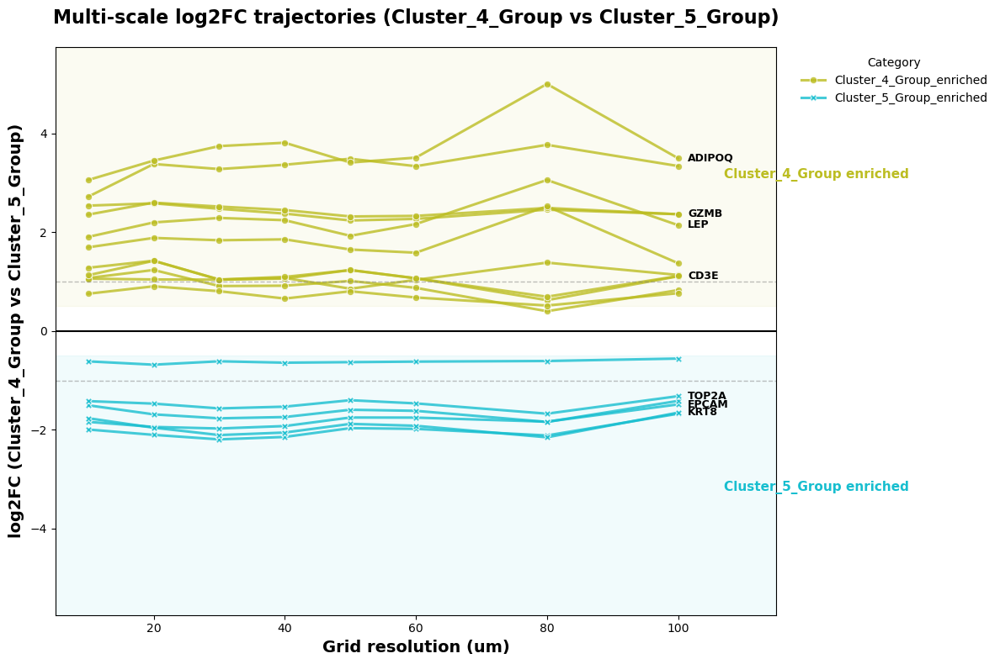

In [12]:
# %%
# ===========================================================================
# Multi-scale log2FC trajectories
# 多尺度 log2FC 轨迹
# ===========================================================================

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# ---------------------------------------------------------------------------
# Context
# 上下文
# ---------------------------------------------------------------------------
ctx = get_compare_context()
gA, gB = ctx["group_a"], ctx["group_b"]
cA, cB = ctx["color_a"], ctx["color_b"]

# ---------------------------------------------------------------------------
# Input check
# 输入检查
# ---------------------------------------------------------------------------
required_cols = {"scale_um", "gene", "log2FC", "category"}
if "plot_df" not in globals() or not required_cols.issubset(plot_df.columns):
    raise ValueError("Missing plot_df with required columns from multi-scale analysis")
if "category_colors" not in globals():
    category_colors = {f"{gA}_enriched": cA, f"{gB}_enriched": cB, "mixed": "dimgray"}

# Genes to label at the rightmost scale.
# 在最大尺度处标注的基因。
LABEL_GENES = ["ADIPOQ", "GZMB", "KRT8", "EPCAM", "CD3E", "TOP2A", "LEP"]

# Reference lines for log2FC (|log2FC|=1 corresponds to a 2-fold change).
# log2FC 参考线（|log2FC|=1 对应 2 倍变化）。
REFERENCE_FC = 1.0

# ---------------------------------------------------------------------------
# Figure
# 作图
# ---------------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(12, 8))

sns.lineplot(
    data=plot_df,
    x="scale_um",
    y="log2FC",
    hue="category",
    style="category",
    units="gene",
    estimator=None,
    palette=category_colors,
    linewidth=2.2,
    alpha=0.8,
    ax=ax,
    markers=True,
    dashes=False,
)

absmax = float(max(2.0, np.nanmax(np.abs(plot_df["log2FC"].to_numpy(float))) * 1.15))
scale_min = float(plot_df["scale_um"].min())
scale_max = float(plot_df["scale_um"].max())

ax.set_ylim(-absmax, absmax)
ax.set_xlim(scale_min - 5, scale_max + 15)

ax.axhline(0, color="black", linewidth=1.5)
ax.axhline(REFERENCE_FC, color="gray", linewidth=1, linestyle="--", alpha=0.5)
ax.axhline(-REFERENCE_FC, color="gray", linewidth=1, linestyle="--", alpha=0.5)

ax.axhspan(0.5, absmax, color=cA, alpha=0.06)
ax.axhspan(-absmax, -0.5, color=cB, alpha=0.06)

ax.text(ax.get_xlim()[1] - 8, absmax * 0.55, f"{gA} enriched", color=cA, fontsize=11, fontweight="bold", va="center")
ax.text(ax.get_xlim()[1] - 8, -absmax * 0.55, f"{gB} enriched", color=cB, fontsize=11, fontweight="bold", va="center")

for gene in LABEL_GENES:
    sub = plot_df[(plot_df["gene"] == gene) & (plot_df["scale_um"] == scale_max)]
    if not sub.empty:
        ax.text(
            scale_max + 1.5,
            float(sub["log2FC"].iloc[0]),
            gene,
            fontsize=9,
            fontweight="bold",
            va="center",
        )

ax.set_title(
    f"Multi-scale log2FC trajectories ({gA} vs {gB})",
    fontsize=16,
    fontweight="bold",
    pad=20,
)
ax.set_xlabel("Grid resolution (um)", fontsize=14, fontweight="bold")
ax.set_ylabel(f"log2FC ({gA} vs {gB})", fontsize=14, fontweight="bold")
ax.legend(title="Category", loc="upper left", bbox_to_anchor=(1.02, 1), frameon=False, fontsize=10)

plt.tight_layout()
plt.show()

Pathway enrichment input summary
Background genes : 321
Cluster_4_Group gene count   : 177
Cluster_5_Group gene count   : 83
Thresholds: q < 0.05, |log2FC| >= 0.3, Mean_CPM >= 10.0
----------------------------------------------------------------------
Running enrichment for Cluster_4_Group (177 genes)...
Running enrichment for Cluster_5_Group (83 genes)...


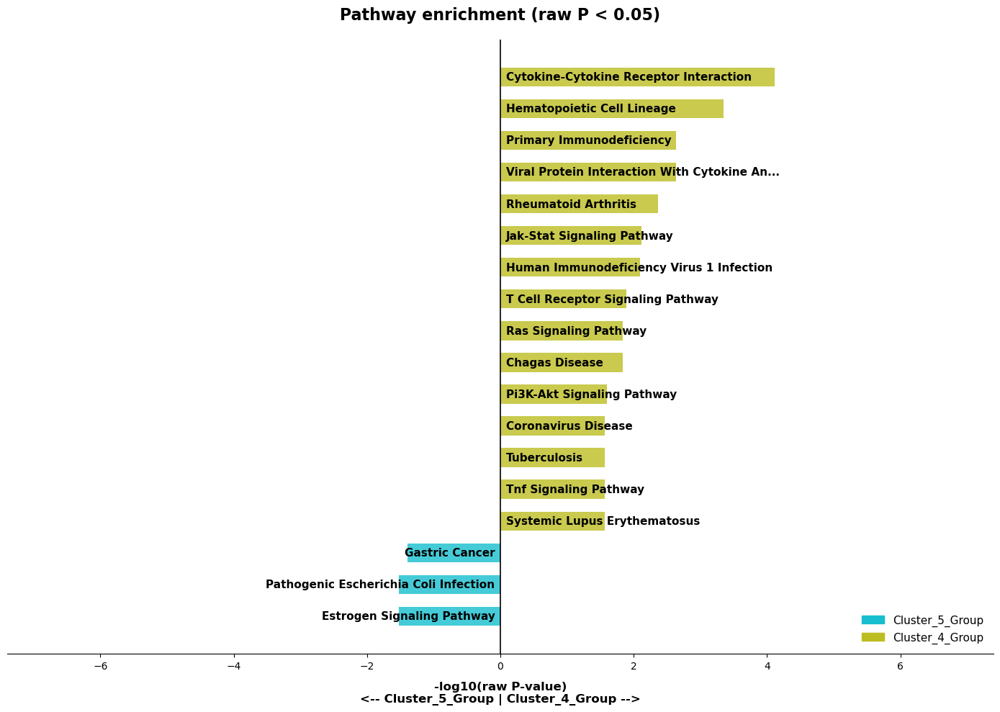

Top terms (Cluster_4_Group):
                                                         Term  P-value  Adjusted P-value  Odds Ratio  Combined Score
                       Cytokine-cytokine receptor interaction 0.000078          0.014251   17.196203      162.683658
                                   Hematopoietic cell lineage 0.000454          0.041560   14.211180      109.382794
Viral protein interaction with cytokine and cytokine receptor 0.002311          0.105709         inf             inf
                                     Primary immunodeficiency 0.002311          0.105709         inf             inf
                                         Rheumatoid arthritis 0.004291          0.157055         inf             inf
----------------------------------------------------------------------
Top terms (Cluster_5_Group):
                                 Term  P-value  Adjusted P-value  Odds Ratio  Combined Score
           Estrogen signaling pathway 0.029715          0.811639    5.021368

In [13]:
# %%
# ===========================================================================
# Pathway enrichment analysis
# 通路富集分析
# ===========================================================================

import re
import gseapy as gp
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# ---------------------------------------------------------------------------
# Context and thresholds
# 上下文与阈值
# ---------------------------------------------------------------------------
ctx = get_compare_context()
gA, gB = ctx["group_a"], ctx["group_b"]
cA, cB = ctx["color_a"], ctx["color_b"]

# Gene selection thresholds for enrichment input.
# 用于富集输入的基因筛选阈值。
ENRICH_FC_THRESHOLD = 0.3
ENRICH_Q_THRESHOLD = 0.05
ENRICH_CPM_THRESHOLD = 10.0

# Display filter: only show terms with raw P below this cutoff.
# 展示过滤：仅显示原始 P 值低于此阈值的条目。
DISPLAY_RAW_P_CUTOFF = 0.05

# Maximum number of terms to display per group.
# 每组展示的最大条目数。
DISPLAY_TOP_N = 15

# Gene set libraries used by gseapy.
# gseapy 使用的基因集库。
GENE_SET_LIBS = ["MSigDB_Hallmark_2020", "GO_Biological_Process_2023", "KEGG_2021_Human"]

# ---------------------------------------------------------------------------
# Input check
# 输入检查
# ---------------------------------------------------------------------------
req = {"qval", "log2FC", "Mean_CPM"}
miss = req - set(dge_results.columns)
if miss:
    raise ValueError(f"dge_results missing: {sorted(miss)}")

# ---------------------------------------------------------------------------
# Select significant genes
# 筛选显著基因
# ---------------------------------------------------------------------------
sig = dge_results.loc[
    (dge_results["qval"] < ENRICH_Q_THRESHOLD)
    & (dge_results["log2FC"].abs() >= ENRICH_FC_THRESHOLD)
    & (dge_results["Mean_CPM"] >= ENRICH_CPM_THRESHOLD)
].copy()

a_genes = sig.index[sig["log2FC"] > 0].tolist()
b_genes = sig.index[sig["log2FC"] < 0].tolist()
bg = dge_results.index.tolist()

print("=" * 70)
print("Pathway enrichment input summary")
print("=" * 70)
print(f"Background genes : {len(bg)}")
print(f"{gA} gene count   : {len(a_genes)}")
print(f"{gB} gene count   : {len(b_genes)}")
print(
    f"Thresholds: q < {ENRICH_Q_THRESHOLD}, "
    f"|log2FC| >= {ENRICH_FC_THRESHOLD}, "
    f"Mean_CPM >= {ENRICH_CPM_THRESHOLD}"
)
print("-" * 70)

# ---------------------------------------------------------------------------
# Run enrichment
# 执行富集
# ---------------------------------------------------------------------------
enrA = enrB = None
try:
    if a_genes:
        print(f"Running enrichment for {gA} ({len(a_genes)} genes)...")
        enrA = gp.enrich(gene_list=a_genes, gene_sets=GENE_SET_LIBS, background=bg, outdir=None)
    else:
        print(f"Skip {gA}: no genes passed thresholds")

    if b_genes:
        print(f"Running enrichment for {gB} ({len(b_genes)} genes)...")
        enrB = gp.enrich(gene_list=b_genes, gene_sets=GENE_SET_LIBS, background=bg, outdir=None)
    else:
        print(f"Skip {gB}: no genes passed thresholds")
except Exception as e:
    print(f"gseapy error: {e}")
    enrA = enrB = None


# ---------------------------------------------------------------------------
# Helper functions
# 辅助函数
# ---------------------------------------------------------------------------
def extract_top_terms(enr, label, color, raw_p_cutoff, top_n):
    """
    Extract top enrichment terms filtered by raw P-value.
    按原始 P 值筛选并提取排名靠前的富集条目。
    """
    if enr is None or getattr(enr, "results", None) is None or enr.results.empty:
        return pd.DataFrame()

    r = enr.results.copy().drop_duplicates(subset=["Term"])
    if "P-value" not in r.columns:
        return pd.DataFrame()

    r["P-value"] = pd.to_numeric(r["P-value"], errors="coerce")
    r = r.loc[r["P-value"].notna() & (r["P-value"] < raw_p_cutoff)].copy()
    if r.empty:
        return pd.DataFrame()

    r["score_rawp"] = -np.log10(r["P-value"] + 1e-10)
    r["group"] = label
    # Broadcast color to match row count; avoids length mismatch when color is an RGBA tuple.
    # 将颜色广播为与行数等长的列表，避免 RGBA 元组被误解为序列。
    r["color"] = [color] * len(r)
    return r.sort_values("score_rawp", ascending=False).head(top_n)


def format_top_terms(terms_df, n=5):
    """
    Format top terms for text display.
    格式化排名靠前的条目用于文本展示。
    """
    if terms_df.empty:
        return "  (none passed display filter)"
    cols = [c for c in ["Term", "P-value", "Adjusted P-value", "Overlap", "Odds Ratio", "Combined Score"] if c in terms_df.columns]
    return (terms_df[cols] if cols else terms_df).head(n).to_string(index=False)


def clean_term_label(t, max_len=45):
    """
    Shorten and clean pathway term labels for plotting.
    缩短并清理通路条目标签用于绘图。
    """
    t = str(t)
    t = re.sub(r"\s*\(GO:\d+\)", "", t)
    t = re.sub(r"\s*Homo sapiens\s*hsa\d+", "", t)
    t = t.replace("HALLMARK_", "").replace("_", " ").title()
    return (t[:max_len - 3] + "...") if len(t) > max_len else t


# ---------------------------------------------------------------------------
# Process results
# 处理结果
# ---------------------------------------------------------------------------
dfA = extract_top_terms(enrA, gA, cA, DISPLAY_RAW_P_CUTOFF, DISPLAY_TOP_N)
dfB = extract_top_terms(enrB, gB, cB, DISPLAY_RAW_P_CUTOFF, DISPLAY_TOP_N)

if dfA.empty and dfB.empty:
    print("No terms passed display filter.")
else:
    # ---------------------------------------------------------------------------
    # Visualization
    # 可视化
    # ---------------------------------------------------------------------------
    enrich_plot_df = pd.concat([dfB, dfA], ignore_index=True)
    enrich_plot_df["plot_score"] = np.where(
        enrich_plot_df["group"] == gB,
        -enrich_plot_df["score_rawp"],
        enrich_plot_df["score_rawp"],
    )
    enrich_plot_df = enrich_plot_df.sort_values("plot_score").reset_index(drop=True)

    fig, ax = plt.subplots(figsize=(14, 10))
    y = np.arange(len(enrich_plot_df))

    ax.barh(y, enrich_plot_df["plot_score"], color=enrich_plot_df["color"], alpha=0.8, height=0.6)
    ax.axvline(0, color="black", linewidth=1.2, zorder=3)

    m = float(enrich_plot_df["score_rawp"].max())
    off = m * 0.02 if np.isfinite(m) and m > 0 else 0.1
    ax.set_xlim(-m * 1.8, m * 1.8)

    for i, row in enrich_plot_df.iterrows():
        lab = clean_term_label(row["Term"])
        if row["plot_score"] > 0:
            ax.text(off, i, lab, va="center", ha="left", fontsize=11, fontweight="bold")
        else:
            ax.text(-off, i, lab, va="center", ha="right", fontsize=11, fontweight="bold")

    ax.set_title(
        f"Pathway enrichment (raw P < {DISPLAY_RAW_P_CUTOFF})",
        fontsize=16, fontweight="bold", pad=20,
    )
    ax.set_xlabel(
        f"-log10(raw P-value)\n<-- {gB} | {gA} -->",
        fontsize=12, fontweight="bold", labelpad=10,
    )
    ax.set_yticks([])
    for s in ["top", "right", "left"]:
        ax.spines[s].set_visible(False)

    ax.legend(
        handles=[mpatches.Patch(color=cB, label=gB), mpatches.Patch(color=cA, label=gA)],
        loc="lower right", frameon=False, fontsize=11,
    )

    plt.tight_layout()
    plt.show()

    # ---------------------------------------------------------------------------
    # Text summary
    # 文本汇总
    # ---------------------------------------------------------------------------
    print("=" * 70)
    print(f"Top terms ({gA}):")
    print(format_top_terms(dfA))
    print("-" * 70)
    print(f"Top terms ({gB}):")
    print(format_top_terms(dfB))
    print("=" * 70)

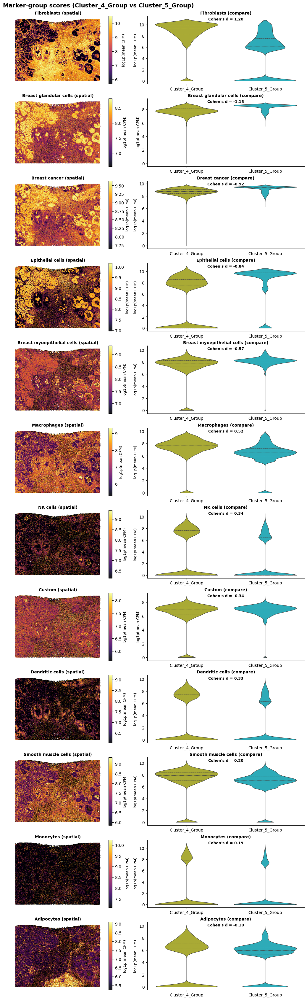

Marker-group score comparison summary (grid-level)
Regions compared: Cluster_4_Group vs Cluster_5_Group
              marker_group   n_a    n_b   mean_a   mean_b  median_a  median_b  cohens_d      pval_mwu      qval_mwu
               Fibroblasts 98295 112034 8.645805 5.001413  9.272310  6.116068  1.200525  0.000000e+00  0.000000e+00
    Breast glandular cells 98295 112034 7.773998 8.354365  7.785241  8.536438 -1.147427  0.000000e+00  0.000000e+00
             Breast cancer 98295 112034 8.706971 9.152079  8.733537  9.348859 -0.915391  0.000000e+00  0.000000e+00
          Epithelial cells 98295 112034 5.252154 8.267041  7.558365  9.549387 -0.841776  0.000000e+00  0.000000e+00
Breast myoepithelial cells 98295 112034 7.326786 8.157463  7.812028  8.201614 -0.568115  0.000000e+00  0.000000e+00
               Macrophages 98295 112034 7.364229 6.469701  7.634736  6.579122  0.524926  0.000000e+00  0.000000e+00
                  NK cells 98295 112034 3.654563 2.402151  0.000000  0.000000  0.343

In [21]:
# %%
# ===========================================================================
# Marker-group scoring and comparison
# 标记基因组评分与比较
# ===========================================================================

import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from statsmodels.stats.multitest import multipletests

warnings.filterwarnings("ignore")

# ---------------------------------------------------------------------------
# Context and configuration
# 上下文与配置
# ---------------------------------------------------------------------------
ctx = get_compare_context()
gA, gB = ctx["group_a"], ctx["group_b"]
cA, cB = ctx["color_a"], ctx["color_b"]

# Maximum number of marker groups to plot (ranked by |Cohen's d|).
# 绘图展示的最大标记基因组数（按 |Cohen's d| 排序）。
TOP_N_GROUPS_TO_PLOT = 12

# Minimum number of genes per marker group required for scoring.
# 每个标记基因组用于评分所需的最小基因数。
MIN_GENES_PER_GROUP = 2


# ---------------------------------------------------------------------------
# Cohen's d (pooled standard deviation)
# Cohen's d（合并标准差）
# ---------------------------------------------------------------------------
def cohens_d(a, b):
    """
    Cohen's d with pooled standard deviation.
    使用合并标准差计算 Cohen's d。
    """
    a = np.asarray(a, float)
    b = np.asarray(b, float)
    a = a[np.isfinite(a)]
    b = b[np.isfinite(b)]
    if len(a) < 2 or len(b) < 2:
        return np.nan
    va = np.var(a, ddof=1)
    vb = np.var(b, ddof=1)
    denom = len(a) + len(b) - 2
    if denom <= 0:
        return np.nan
    pooled = np.sqrt(((len(a) - 1) * va + (len(b) - 1) * vb) / denom)
    if pooled == 0 or not np.isfinite(pooled):
        return np.nan
    return float((a.mean() - b.mean()) / pooled)


# ---------------------------------------------------------------------------
# Input checks
# 输入检查
# ---------------------------------------------------------------------------
if "grid_cpm" not in globals():
    raise NameError("Missing grid_cpm. Run the grid-level count matrix block first.")

if "MARKER_CSV" not in globals():
    raise NameError("Missing MARKER_CSV")

# ---------------------------------------------------------------------------
# Marker-group scoring
# 标记基因组评分
# ---------------------------------------------------------------------------
# Each marker group score = log1p(mean CPM of member genes) per grid.
# 每个标记基因组的评分 = 每个网格中成员基因 CPM 均值的 log1p。
marker_df = pd.read_csv(MARKER_CSV).dropna(subset=["gene", "group"])

score_dict = {}
for grp, genes in marker_df.groupby("group")["gene"]:
    keep = [g for g in genes.unique() if g in grid_cpm.columns]
    if len(keep) >= MIN_GENES_PER_GROUP:
        score_dict[grp] = np.log1p(grid_cpm[keep].mean(axis=1))

if not score_dict:
    raise ValueError("No marker groups could be scored (too few overlapping genes)")

score_mat = pd.DataFrame(score_dict, index=grid_cpm.index)

# ---------------------------------------------------------------------------
# Attach spatial coordinates and region labels
# 关联空间坐标与区域标签
# ---------------------------------------------------------------------------
idx_df = score_mat.index.to_frame(index=False)

# grid_cpm index should contain cluster_sorted from the merged block.
# grid_cpm 的索引应包含合并段中的 cluster_sorted。
if "cluster_sorted" in idx_df.columns:
    idx_df["region"] = np.where(
        idx_df["cluster_sorted"] == ctx["cluster_a"], gA,
        np.where(idx_df["cluster_sorted"] == ctx["cluster_b"], gB, ""),
    )
elif "dge_group" in idx_df.columns:
    idx_df["region"] = idx_df["dge_group"].astype(str)
else:
    raise ValueError("Cannot determine region from grid_cpm index (need cluster_sorted or dge_group)")

x_col, y_col = "x_um", "y_um"
coord_map = grid_pd[["x_bin", "y_bin", x_col, y_col]].drop_duplicates(["x_bin", "y_bin"])

score_df = idx_df[["x_bin", "y_bin", "region"]].merge(coord_map, on=["x_bin", "y_bin"], how="left")
score_df = pd.concat([score_df.reset_index(drop=True), score_mat.reset_index(drop=True)], axis=1)
score_df_filtered = score_df.dropna(subset=["region", x_col, y_col]).copy()

sub = score_df_filtered.loc[score_df_filtered["region"].isin([gA, gB])].copy()
if sub.empty:
    raise ValueError(f"No rows for compare groups: {gA}, {gB}")

# ---------------------------------------------------------------------------
# Effect size ranking
# 效应量排序
# ---------------------------------------------------------------------------
meta_cols = {"x_bin", "y_bin", x_col, y_col, "region"}
marker_cols = [
    c for c in score_df_filtered.columns
    if c not in meta_cols and pd.api.types.is_numeric_dtype(score_df_filtered[c])
]

effect_df = pd.DataFrame({
    "marker_group": marker_cols,
    "cohens_d": [
        cohens_d(sub.loc[sub["region"] == gA, m], sub.loc[sub["region"] == gB, m])
        for m in marker_cols
    ],
}).dropna(subset=["cohens_d"])

sorted_groups = (
    effect_df
    .assign(abs_d=effect_df["cohens_d"].abs())
    .sort_values("abs_d", ascending=False)["marker_group"]
    .head(TOP_N_GROUPS_TO_PLOT)
    .tolist()
)

if not sorted_groups:
    raise ValueError("No marker groups with computable effect size")

d_map = dict(zip(effect_df["marker_group"], effect_df["cohens_d"]))

# ---------------------------------------------------------------------------
# Visualization: spatial map + violin per marker group
# 可视化：每个标记基因组的空间图 + 小提琴图
# ---------------------------------------------------------------------------
vio_df = score_df_filtered.loc[score_df_filtered["region"].isin([gA, gB])].copy()

fig, axes = plt.subplots(
    nrows=len(sorted_groups),
    ncols=2,
    figsize=(14, max(8, len(sorted_groups) * 2.8)),
    constrained_layout=True,
    gridspec_kw={"width_ratios": [1.35, 1.0]},
)
if len(sorted_groups) == 1:
    axes = np.array([axes])

for i, grp in enumerate(sorted_groups):
    axm, axv = axes[i, 0], axes[i, 1]

    # Spatial score map.
    # 空间评分图。
    vals = score_df_filtered[grp].to_numpy(float)
    fp = vals[np.isfinite(vals) & (vals > 0)]
    if fp.size >= 2:
        vmin, vmax = np.percentile(fp, [2, 98])
        vmax = vmax if vmin != vmax else vmin + 1e-9
    else:
        vmin, vmax = 0.0, 1.0

    sc = axm.scatter(
        score_df_filtered[x_col], score_df_filtered[y_col],
        c=score_df_filtered[grp],
        s=0.8, cmap="inferno", alpha=0.9, edgecolors="none",
        vmin=vmin, vmax=vmax, rasterized=True,
    )
    axm.set_title(f"{grp} (spatial)", fontsize=10, fontweight="bold", pad=4)
    axm.set_aspect("equal")
    axm.invert_yaxis()
    axm.set_xticks([])
    axm.set_yticks([])
    for s in ["top", "right", "left", "bottom"]:
        axm.spines[s].set_visible(False)
    cb = fig.colorbar(sc, ax=axm, fraction=0.046, pad=0.02)
    cb.set_label("log1p(mean CPM)", fontsize=9)

    # Violin comparison.
    # 小提琴图比较。
    sns.violinplot(
        data=vio_df, x="region", y=grp, hue="region",
        order=[gA, gB], palette={gA: cA, gB: cB},
        inner="quartile", cut=0, linewidth=0.8, dodge=False, ax=axv,
    )
    if axv.legend_ is not None:
        axv.legend_.remove()
    axv.set_title(f"{grp} (compare)", fontsize=10, fontweight="bold", pad=4)
    axv.set_xlabel("")
    axv.set_ylabel("log1p(mean CPM)", fontsize=9)
    for s in ["top", "right"]:
        axv.spines[s].set_visible(False)

    d = d_map.get(grp, np.nan)
    if np.isfinite(d):
        axv.text(
            0.5, 0.98, f"Cohen's d = {d:.2f}",
            transform=axv.transAxes, ha="center", va="top",
            fontsize=9, fontweight="bold",
        )

fig.suptitle(
    f"Marker-group scores ({gA} vs {gB})",
    fontsize=14, fontweight="bold",
)
plt.show()

# ---------------------------------------------------------------------------
# Statistical comparison (all marker groups)
# 统计比较（全部标记基因组）
# ---------------------------------------------------------------------------
stat_rows = []
for grp in marker_cols:
    a = sub.loc[sub["region"] == gA, grp].to_numpy(float)
    b = sub.loc[sub["region"] == gB, grp].to_numpy(float)
    a = a[np.isfinite(a)]
    b = b[np.isfinite(b)]

    p = np.nan
    if len(a) >= 2 and len(b) >= 2 and (np.var(a) > 0 or np.var(b) > 0):
        p = float(stats.mannwhitneyu(a, b, alternative="two-sided")[1])

    stat_rows.append({
        "marker_group": grp,
        "region_a": gA,
        "region_b": gB,
        "n_a": int(len(a)),
        "n_b": int(len(b)),
        "mean_a": float(np.mean(a)) if len(a) else np.nan,
        "mean_b": float(np.mean(b)) if len(b) else np.nan,
        "median_a": float(np.median(a)) if len(a) else np.nan,
        "median_b": float(np.median(b)) if len(b) else np.nan,
        "cohens_d": cohens_d(a, b),
        "pval_mwu": p,
    })

effect_stats_table = pd.DataFrame(stat_rows)
_, q, _, _ = multipletests(effect_stats_table["pval_mwu"].fillna(1.0).to_numpy(float), method="fdr_bh")
effect_stats_table["qval_mwu"] = q
effect_stats_table["neglog10_qval_mwu"] = -np.log10(effect_stats_table["qval_mwu"] + 1e-300)
effect_stats_table = (
    effect_stats_table
    .assign(abs_d=effect_stats_table["cohens_d"].abs())
    .sort_values("abs_d", ascending=False)
    .drop(columns=["abs_d"])
    .reset_index(drop=True)
)

print("=" * 80)
print("Marker-group score comparison summary (grid-level)")
print("=" * 80)
print(f"Regions compared: {gA} vs {gB}")
print(
    effect_stats_table[
        ["marker_group", "n_a", "n_b", "mean_a", "mean_b",
         "median_a", "median_b", "cohens_d", "pval_mwu", "qval_mwu"]
    ].head(30).to_string(index=False)
)
print("=" * 80)

Radius sensitivity sweep
 radius_um          region  rho_z_density  partial_rho_z_density  rho_z_heter_soft  partial_rho_z_heter_soft
        40 Cluster_4_Group       0.030542               0.033318          0.032222                  0.032531
        60 Cluster_4_Group       0.035798               0.038649          0.029002                  0.029202
        80 Cluster_4_Group       0.040352               0.043381          0.026583                  0.026733
       100 Cluster_4_Group       0.044305               0.047359          0.024574                  0.024673
       120 Cluster_4_Group       0.046512               0.049488          0.022325                  0.022406
        40 Cluster_5_Group      -0.069540              -0.171617          0.262911                  0.312919
        60 Cluster_5_Group      -0.068175              -0.155861          0.253874                  0.297314
        80 Cluster_5_Group      -0.064372              -0.142097          0.248982                  0.2

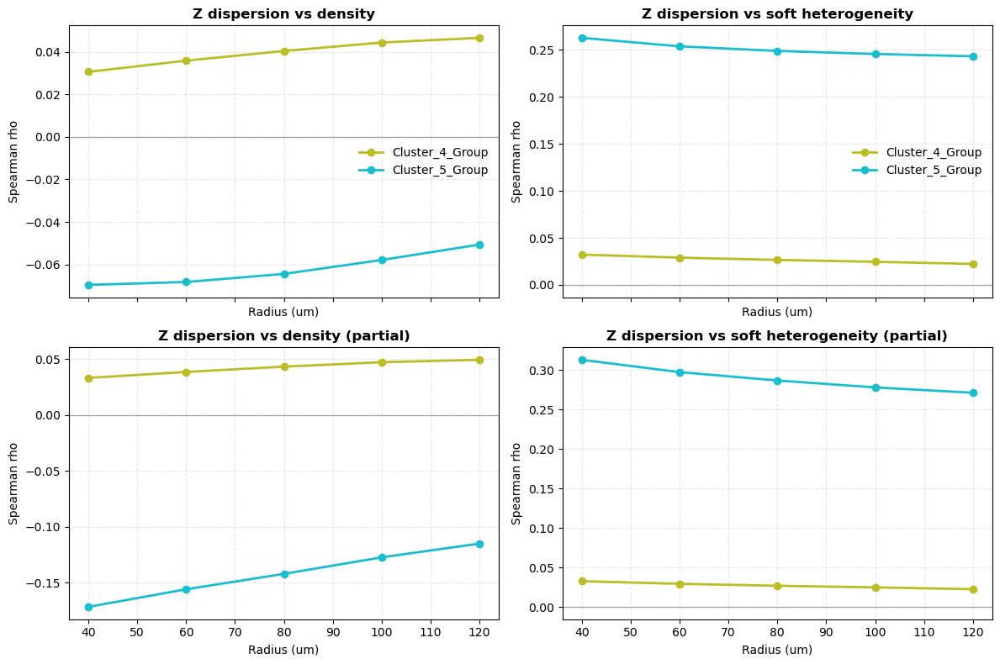

In [15]:
# %%
# ===========================================================================
# Radius sensitivity sweep with partial Spearman correlations
# 半径敏感性扫描与偏 Spearman 相关
# ===========================================================================

import warnings
import numpy as np
import pandas as pd
from scipy.spatial import cKDTree
from scipy import stats
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore")

# ---------------------------------------------------------------------------
# Context and configuration
# 上下文与配置
# ---------------------------------------------------------------------------
ctx = get_compare_context()
gA, gB = ctx["group_a"], ctx["group_b"]
cA, cB = ctx["color_a"], ctx["color_b"]

# Radii to sweep (um).
# 扫描的半径范围（微米）。
RADIUS_RANGE_UM = list(range(40, 121, 20))

# Minimum sample size for Spearman / partial Spearman.
# Spearman / 偏 Spearman 所需的最小样本量。
MIN_SAMPLES_CORR = 20

# ---------------------------------------------------------------------------
# Input checks
# 输入检查
# ---------------------------------------------------------------------------
if "grid_pd" not in globals():
    raise NameError("Missing grid_pd")
if "score_df_filtered" not in globals():
    raise NameError("Missing score_df_filtered")

x_col, y_col = "x_um", "y_um"
z_col = "z_stacking_index_um" if "z_stacking_index_um" in grid_pd.columns else "z_stacking_index"

req = {x_col, y_col, z_col, "transcript_count"}
miss = req - set(grid_pd.columns)
if miss:
    raise ValueError(f"grid_pd missing: {sorted(miss)}")

# ---------------------------------------------------------------------------
# Merge and prepare working table
# 合并并准备工作表
# ---------------------------------------------------------------------------
exclude = {x_col, y_col, "x_bin", "y_bin", "region"}
marker_cols = [
    c for c in score_df_filtered.columns
    if c not in exclude and pd.api.types.is_numeric_dtype(score_df_filtered[c])
]
if not marker_cols:
    raise ValueError("No marker-group columns found in score_df_filtered")

base = (
    score_df_filtered[[x_col, y_col, "region"] + marker_cols]
    .merge(grid_pd[[x_col, y_col, z_col, "transcript_count"]], on=[x_col, y_col], how="inner")
    .copy()
)
base = base.loc[base["region"].isin([gA, gB])].copy()
if base.empty:
    raise ValueError(f"No rows for {gA}/{gB}")

base = base.rename(columns={x_col: "x_coord", y_col: "y_coord", z_col: "z_dispersion"})
base["dominant_marker_group"] = base[marker_cols].idxmax(axis=1)

region_order = [gA, gB]
color_map = {gA: cA, gB: cB}

coords = base[["x_coord", "y_coord"]].to_numpy(float)
tree = cKDTree(coords)
dom = base["dominant_marker_group"].to_numpy()
scores = np.clip(base[marker_cols].to_numpy(float), 0.0, None)


# ---------------------------------------------------------------------------
# Correlation utilities
# 相关性工具函数
# ---------------------------------------------------------------------------
def spearman(x, y, min_n=MIN_SAMPLES_CORR):
    """
    Spearman rank correlation with minimum sample guard.
    带最小样本量保护的 Spearman 秩相关。
    """
    x = np.asarray(x, float)
    y = np.asarray(y, float)
    m = np.isfinite(x) & np.isfinite(y)
    x, y = x[m], y[m]
    if len(x) < min_n:
        return np.nan, np.nan, int(len(x))
    r, p = stats.spearmanr(x, y)
    return float(r), float(p), int(len(x))


def partial_spearman(x, y, c, min_n=MIN_SAMPLES_CORR):
    """
    Partial Spearman correlation controlling for covariate c.
    控制协变量 c 的偏 Spearman 相关。

    Residualize ranks of x and y on ranks of c via OLS, then correlate residuals.
    对 x 和 y 的秩在 c 的秩上做 OLS 残差化，再对残差求相关。
    """
    x = np.asarray(x, float)
    y = np.asarray(y, float)
    c = np.asarray(c, float)
    m = np.isfinite(x) & np.isfinite(y) & np.isfinite(c)
    x, y, c = x[m], y[m], c[m]
    n = int(len(x))
    if n < min_n:
        return np.nan, np.nan, n

    rx = stats.rankdata(x, method="average")
    ry = stats.rankdata(y, method="average")
    rc = stats.rankdata(c, method="average")

    D = np.column_stack([np.ones(n), rc])
    bx, *_ = np.linalg.lstsq(D, rx, rcond=None)
    by, *_ = np.linalg.lstsq(D, ry, rcond=None)

    r, p = stats.spearmanr(rx - D @ bx, ry - D @ by)
    return float(r), float(p), n


# ---------------------------------------------------------------------------
# Neighborhood metrics at a given radius
# 给定半径下的邻域指标
# ---------------------------------------------------------------------------
def compute_neighborhood_metrics(radius):
    """
    Compute density and soft heterogeneity for each grid at a given radius.
    在给定半径下计算每个网格的密度与软异质性。

    Soft heterogeneity: 1 - sum(p_i^2) where p_i is the proportion of
    aggregated marker-group score from neighbors assigned to group i.
    软异质性：1 - Σ(p_i²)，其中 p_i 是邻居中第 i 组聚合标记评分的占比。
    """
    nbrs = tree.query_ball_point(coords, r=float(radius))
    area = float(np.pi * (radius ** 2))

    den = np.empty(len(base), float)
    soft = np.empty(len(base), float)

    for i, idx in enumerate(nbrs):
        idx = [j for j in idx if j != i]
        k = len(idx)
        den[i] = k / area
        if k == 0:
            soft[i] = np.nan
            continue
        agg = scores[idx].sum(axis=0)
        tot = float(agg.sum())
        soft[i] = np.nan if tot <= 0 else float(1.0 - np.sum((agg / tot) ** 2))

    return den, soft


# ---------------------------------------------------------------------------
# Sweep across radii
# 跨半径扫描
# ---------------------------------------------------------------------------
cov = np.log1p(base["transcript_count"].to_numpy(float))
rows = []

for radius in RADIUS_RANGE_UM:
    den, soft = compute_neighborhood_metrics(float(radius))
    tmp = base[["region", "z_dispersion"]].copy()
    tmp["cov"] = cov
    tmp["den"] = den
    tmp["soft"] = soft

    for reg in region_order:
        s = tmp.loc[tmp["region"] == reg]
        rho_d, _, _ = spearman(s["z_dispersion"], s["den"])
        rho_s, _, _ = spearman(s["z_dispersion"], s["soft"])
        prho_d, _, _ = partial_spearman(s["z_dispersion"], s["den"], s["cov"])
        prho_s, _, _ = partial_spearman(s["z_dispersion"], s["soft"], s["cov"])
        rows.append({
            "radius_um": int(radius),
            "region": reg,
            "rho_z_density": rho_d,
            "partial_rho_z_density": prho_d,
            "rho_z_heter_soft": rho_s,
            "partial_rho_z_heter_soft": prho_s,
        })

sens_df = pd.DataFrame(rows).sort_values(["region", "radius_um"]).reset_index(drop=True)

print("=" * 70)
print("Radius sensitivity sweep")
print("=" * 70)
print(
    sens_df[
        ["radius_um", "region", "rho_z_density", "partial_rho_z_density",
         "rho_z_heter_soft", "partial_rho_z_heter_soft"]
    ].to_string(index=False)
)
print("=" * 70)

# ---------------------------------------------------------------------------
# Visualization
# 可视化
# ---------------------------------------------------------------------------
fig, axes = plt.subplots(2, 2, figsize=(12, 8), sharex=True)

for reg in region_order:
    s = sens_df.loc[sens_df["region"] == reg]
    col = color_map.get(reg, "gray")
    axes[0, 0].plot(s["radius_um"], s["rho_z_density"], marker="o", lw=2, color=col, label=reg)
    axes[1, 0].plot(s["radius_um"], s["partial_rho_z_density"], marker="o", lw=2, color=col, label=reg)
    axes[0, 1].plot(s["radius_um"], s["rho_z_heter_soft"], marker="o", lw=2, color=col, label=reg)
    axes[1, 1].plot(s["radius_um"], s["partial_rho_z_heter_soft"], marker="o", lw=2, color=col, label=reg)

for ax in axes.ravel():
    ax.axhline(0, color="black", lw=1, alpha=0.3)
    ax.set_xlabel("Radius (um)")
    ax.set_ylabel("Spearman rho")
    ax.grid(True, ls="--", alpha=0.3)

axes[0, 0].set_title("Z dispersion vs density", fontweight="bold")
axes[1, 0].set_title("Z dispersion vs density (partial)", fontweight="bold")
axes[0, 1].set_title("Z dispersion vs soft heterogeneity", fontweight="bold")
axes[1, 1].set_title("Z dispersion vs soft heterogeneity (partial)", fontweight="bold")

axes[0, 0].legend(frameon=False)
axes[0, 1].legend(frameon=False)

plt.tight_layout()
plt.show()

Interface: negative=Cluster_5_Group, positive=Cluster_4_Group
Features to plot: 18


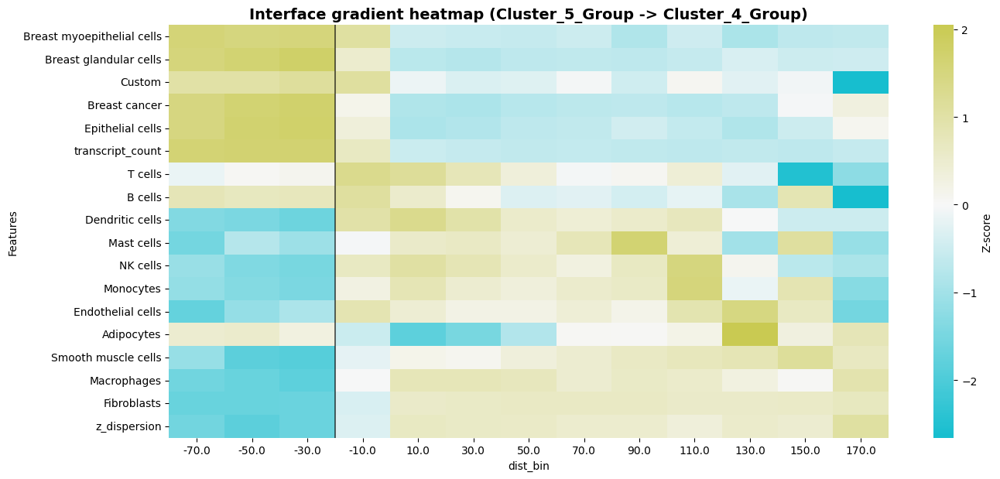

In [16]:
# %%
# ===========================================================================
# Signed distance to boundary and interface gradient heatmap
# 到边界的有符号距离与界面梯度热图
# ===========================================================================

import numpy as np
import pandas as pd
from scipy.spatial import cKDTree
import seaborn as sns
import matplotlib.pyplot as plt

# ---------------------------------------------------------------------------
# Context and configuration
# 上下文与配置
# ---------------------------------------------------------------------------
ctx = get_compare_context()
gA, gB = ctx["group_a"], ctx["group_b"]

# Radius used to identify boundary grids (um).
# 用于识别边界网格的半径（微米）。
BOUNDARY_RADIUS_UM = 30.0

# Distance binning parameters for heatmap.
# 热图的距离分箱参数。
HEATMAP_BIN_WIDTH_UM = 20.0
HEATMAP_DIST_MIN_UM = -300.0
HEATMAP_DIST_MAX_UM = 300.0
HEATMAP_MIN_COUNT_PER_BIN = 20


# ---------------------------------------------------------------------------
# Signed distance computation
# 有符号距离计算
# ---------------------------------------------------------------------------
def compute_signed_distance_to_boundary(
    base_df, negative_label, positive_label,
    x_col, y_col, region_col="region",
    boundary_radius_um=BOUNDARY_RADIUS_UM,
):
    """
    Compute signed distance from each grid to the nearest boundary grid.
    计算每个网格到最近边界网格的有符号距离。

    Boundary grids are those within boundary_radius_um of the opposing region.
    边界网格定义为在 boundary_radius_um 范围内存在对侧区域网格的点。

    Sign convention: negative for grids in negative_label, positive for positive_label.
    符号约定：negative_label 侧为负，positive_label 侧为正。
    """
    df = base_df.copy()
    df = df[df[region_col].isin([negative_label, positive_label])].copy()
    if df.empty:
        raise ValueError("No rows left after region filter")

    coords = df[[x_col, y_col]].to_numpy(float)
    regions = df[region_col].to_numpy()

    neg = regions == negative_label
    pos = regions == positive_label
    if neg.sum() == 0 or pos.sum() == 0:
        raise ValueError("One selected group is empty")

    ni = np.where(neg)[0]
    pi = np.where(pos)[0]

    ntree = cKDTree(coords[ni])
    ptree = cKDTree(coords[pi])

    # A grid is on the boundary if it has at least one neighbor from the other region.
    # 若一个网格在给定半径内存在至少一个对侧区域的邻居，则视为边界网格。
    neg_has_pos = ptree.query_ball_point(coords[ni], r=float(boundary_radius_um))
    pos_has_neg = ntree.query_ball_point(coords[pi], r=float(boundary_radius_um))

    is_boundary = np.zeros(len(df), dtype=bool)
    is_boundary[ni] = np.array([len(v) > 0 for v in neg_has_pos], dtype=bool)
    is_boundary[pi] = np.array([len(v) > 0 for v in pos_has_neg], dtype=bool)

    bcoords = coords[is_boundary]
    if bcoords.shape[0] == 0:
        raise ValueError("No boundary points found; consider increasing boundary_radius_um")

    d, _ = cKDTree(bcoords).query(coords, k=1)
    signed = d.astype(float)
    signed[neg] *= -1.0

    df["signed_dist_um"] = signed
    df["is_boundary"] = is_boundary

    boundary_df = df.loc[df["is_boundary"], [x_col, y_col, region_col]].copy()
    return df, boundary_df


# ---------------------------------------------------------------------------
# Interface gradient heatmap
# 界面梯度热图
# ---------------------------------------------------------------------------
def plot_interface_heatmap(
    signed_df, features,
    dist_col="signed_dist_um",
    bin_width_um=HEATMAP_BIN_WIDTH_UM,
    dist_min_um=HEATMAP_DIST_MIN_UM,
    dist_max_um=HEATMAP_DIST_MAX_UM,
    min_count_per_bin=HEATMAP_MIN_COUNT_PER_BIN,
    zscore_by_feature=True,
    title="Interface gradient heatmap",
    cmap=None,
):
    """
    Bin grids by signed distance and plot feature means as a heatmap.
    按有符号距离对网格分箱，并将特征均值绘制为热图。

    If zscore_by_feature is True, each feature row is z-scored across distance bins.
    若 zscore_by_feature 为 True，则对每个特征行在距离分箱间做 z-score 标准化。
    """
    d = signed_df.copy()
    d = d[(d[dist_col] >= dist_min_um) & (d[dist_col] <= dist_max_um)].copy()
    if d.empty:
        raise ValueError("No data in distance window")

    miss = [f for f in features if f not in d.columns]
    if miss:
        raise ValueError(f"Missing features: {miss}")

    edges = np.arange(dist_min_um, dist_max_um + bin_width_um, bin_width_um)
    centers = (edges[:-1] + edges[1:]) / 2.0

    d["dist_bin"] = pd.cut(d[dist_col], bins=edges, labels=centers, include_lowest=True)
    mat = d.groupby("dist_bin", observed=False)[features].mean().T
    counts = d.groupby("dist_bin", observed=False).size().reindex(mat.columns, fill_value=0)

    valid = counts[counts >= min_count_per_bin].index
    mat = mat[valid]
    if mat.shape[1] == 0:
        raise ValueError("No bins remain after min_count_per_bin filter")

    if zscore_by_feature and mat.shape[1] > 1:
        mat = mat.sub(mat.mean(axis=1), axis=0)
        mat = mat.div(mat.std(axis=1).replace(0, np.nan), axis=0)

    # Order features by the distance bin where they peak.
    # 按特征达到峰值的距离分箱排序。
    xv = np.array([float(c) for c in mat.columns.astype(float)])
    peak_positions = np.nanargmax(mat.to_numpy(), axis=1)
    order = np.argsort(xv[peak_positions])
    mat = mat.iloc[order]

    plt.figure(figsize=(14, max(5, 0.35 * len(features))))
    ax = sns.heatmap(
        mat,
        cmap=(ctx["cmap_ab"] if cmap is None else cmap),
        center=0.0 if zscore_by_feature else None,
        cbar_kws={"label": "Z-score" if zscore_by_feature else "Mean value"},
    )
    ax.set_title(title, fontsize=14, fontweight="bold")
    ax.set_ylabel("Features")

    # Mark the boundary (distance ~ 0).
    # 标记边界位置（距离 ≈ 0）。
    xv = np.array([float(c) for c in mat.columns.astype(float)])
    if xv.size:
        ax.axvline(int(np.argmin(np.abs(xv))), color="black", lw=1.2, alpha=0.7)

    plt.tight_layout()
    plt.show()

    return mat, counts


# ---------------------------------------------------------------------------
# Execution
# 执行
# ---------------------------------------------------------------------------
if "base" not in globals():
    raise NameError("Missing base")

if {"x_coord", "y_coord"}.issubset(base.columns):
    x_col, y_col = "x_coord", "y_coord"
elif {"x_um", "y_um"}.issubset(base.columns):
    x_col, y_col = "x_um", "y_um"
else:
    raise ValueError(f"base missing coordinate columns, got: {sorted(base.columns.tolist())}")

if "region" not in base.columns:
    raise ValueError("base missing region column")

# Convention: negative side = gB, positive side = gA.
# 约定：负侧 = gB，正侧 = gA。
negative_label, positive_label = gB, gA

signed_base, boundary_points = compute_signed_distance_to_boundary(
    base_df=base,
    negative_label=negative_label,
    positive_label=positive_label,
    x_col=x_col,
    y_col=y_col,
    region_col="region",
    boundary_radius_um=BOUNDARY_RADIUS_UM,
)

# Select numeric features, excluding metadata and derived columns.
# 选择数值特征，排除元数据与派生列。
exclude = {
    x_col, y_col, "x_bin", "y_bin", "region",
    "dominant_marker_group",
    "neighbor_count", "neighbor_density_per_um2", "neighbor_density_per_area",
    "heterogeneity_index_hard", "heter_hard", "heter_soft",
    "signed_dist_um", "is_boundary",
}
features = [
    c for c in signed_base.columns
    if c not in exclude and pd.api.types.is_numeric_dtype(signed_base[c])
]
if not features:
    raise ValueError("No numeric features available for heatmap")

print(f"Interface: negative={negative_label}, positive={positive_label}")
print(f"Features to plot: {len(features)}")

mat, bin_counts = plot_interface_heatmap(
    signed_df=signed_base,
    features=features,
    dist_col="signed_dist_um",
    bin_width_um=HEATMAP_BIN_WIDTH_UM,
    dist_min_um=HEATMAP_DIST_MIN_UM,
    dist_max_um=HEATMAP_DIST_MAX_UM,
    min_count_per_bin=HEATMAP_MIN_COUNT_PER_BIN,
    zscore_by_feature=True,
    title=f"Interface gradient heatmap ({negative_label} -> {positive_label})",
    cmap=ctx["cmap_ab"],
)

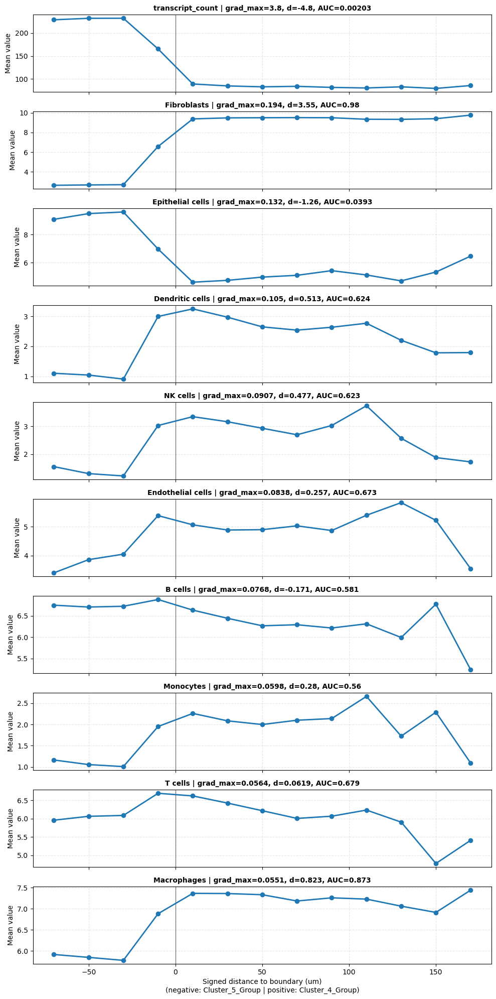

                   feature  contrast_d_pos_minus_neg  slope_near0_per_um  grad_max_abs_per_um  auc_sep_pos_vs_neg  n_total  n_neg_window  n_pos_window  n_slope_window
          transcript_count                 -4.801366           -2.586306             3.801980            0.002026   210329          2440          7995          208085
               Fibroblasts                  3.551877            0.113919             0.193911            0.980011   210329          2440          7995          208085
          Epithelial cells                 -1.260953           -0.082457             0.131943            0.039347   210329          2440          7995          208085
           Dendritic cells                  0.512734            0.028641             0.104510            0.624390   210329          2440          7995          208085
                  NK cells                  0.477007            0.028410             0.090728            0.623284   210329          2440          7995          20808

In [17]:
# %%
# ===========================================================================
# Interface strength and sharpness metrics
# 界面强度与锐度指标
# ===========================================================================

import numpy as np
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt

# ---------------------------------------------------------------------------
# Context and configuration
# 上下文与配置
# ---------------------------------------------------------------------------
ctx = get_compare_context()
gA, gB = ctx["group_a"], ctx["group_b"]

# Distance windows for contrast and slope estimation (um).
# 用于对比度和斜率估计的距离窗口（微米）。
NEG_WINDOW = (-150.0, -30.0)
POS_WINDOW = (30.0, 150.0)
SLOPE_WINDOW = (-60.0, 60.0)

# Distance range and bin width for profile construction (um).
# 用于构建 profile 的距离范围与分箱宽度（微米）。
PROFILE_DIST_MIN_UM = -300.0
PROFILE_DIST_MAX_UM = 300.0
PROFILE_BIN_WIDTH_UM = 20.0
PROFILE_MIN_COUNT_PER_BIN = 20

# Number of top features to plot.
# 绘制的排名靠前的特征数。
N_PLOT = 10

# Minimum data points per feature to compute metrics.
# 计算指标所需的每个特征最小数据点数。
MIN_POINTS_PER_FEATURE = 30

# Minimum data points for slope fitting within the slope window.
# 斜率窗口内拟合所需的最小数据点数。
MIN_POINTS_FOR_SLOPE = 30

# Minimum data points for AUC separation estimate.
# AUC 分离度估计所需的最小数据点数。
MIN_POINTS_FOR_AUC = 10


# ---------------------------------------------------------------------------
# Helper: Cohen's d (pooled)
# 辅助函数：Cohen's d（合并标准差）
# ---------------------------------------------------------------------------
def _cohens_d(a, b):
    a = np.asarray(a, float)
    b = np.asarray(b, float)
    a = a[np.isfinite(a)]
    b = b[np.isfinite(b)]
    if len(a) < 2 or len(b) < 2:
        return np.nan
    va, vb = a.var(ddof=1), b.var(ddof=1)
    denom = len(a) + len(b) - 2
    if denom <= 0:
        return np.nan
    pooled = np.sqrt(((len(a) - 1) * va + (len(b) - 1) * vb) / denom)
    if not np.isfinite(pooled) or pooled == 0:
        return np.nan
    return float((a.mean() - b.mean()) / pooled)


# ---------------------------------------------------------------------------
# Helper: AUC-based separation (from Mann-Whitney U)
# 辅助函数：基于 AUC 的分离度（由 Mann-Whitney U 推导）
# ---------------------------------------------------------------------------
def _auc_separation(scores, labels):
    """
    AUC = U / (n1 * n0), derived from Mann-Whitney U statistic.
    AUC = U / (n1 * n0)，由 Mann-Whitney U 统计量推导。
    """
    s = np.asarray(scores, float)
    y = np.asarray(labels, int)
    m = np.isfinite(s) & np.isfinite(y)
    s, y = s[m], y[m]
    if len(s) < MIN_POINTS_FOR_AUC or len(np.unique(y)) < 2:
        return np.nan
    u, _ = stats.mannwhitneyu(s[y == 1], s[y == 0], alternative="two-sided")
    n1 = int((y == 1).sum())
    n0 = int((y == 0).sum())
    return float(u / (n1 * n0))


# ---------------------------------------------------------------------------
# Main function
# 主函数
# ---------------------------------------------------------------------------
def compute_interface_metrics(
    signed_df, features,
    dist_col="signed_dist_um",
    neg_window=NEG_WINDOW,
    pos_window=POS_WINDOW,
    slope_window=SLOPE_WINDOW,
    dist_min_um=PROFILE_DIST_MIN_UM,
    dist_max_um=PROFILE_DIST_MAX_UM,
    bin_width_um=PROFILE_BIN_WIDTH_UM,
    min_n_per_bin=PROFILE_MIN_COUNT_PER_BIN,
    plot_profiles=True,
    n_plot=N_PLOT,
    sort_by="grad_max_abs_per_um",
    negative_label="Group_B",
    positive_label="Group_A",
):
    """
    Compute per-feature interface metrics from signed-distance data.
    从有符号距离数据中计算每个特征的界面指标。

    Metrics per feature:
    每个特征的指标：
      - contrast_d: Cohen's d between positive and negative windows.
        contrast_d：正窗与负窗之间的 Cohen's d。
      - slope_near0: linear slope within the slope window.
        slope_near0：斜率窗口内的线性斜率。
      - grad_max_abs: maximum absolute gradient across distance bins.
        grad_max_abs：距离分箱间的最大绝对梯度。
      - auc_sep: AUC separation between positive and negative windows.
        auc_sep：正窗与负窗之间的 AUC 分离度。
    """
    if dist_col not in signed_df.columns:
        raise ValueError(f"Missing {dist_col}")
    miss = [f for f in features if f not in signed_df.columns]
    if miss:
        raise ValueError(f"Missing features: {miss}")

    df0 = signed_df.copy()
    df0 = df0[np.isfinite(df0[dist_col].to_numpy(float))].copy()
    if df0.empty:
        raise ValueError("No finite distance rows")

    edges = np.arange(dist_min_um, dist_max_um + bin_width_um, bin_width_um)
    centers = (edges[:-1] + edges[1:]) / 2.0

    dist = df0[dist_col].to_numpy(float)
    metrics = []
    profiles = {}

    for feat in features:
        y0 = df0[feat].to_numpy(float)
        m = np.isfinite(y0)
        d, y = dist[m], y0[m]
        if len(y) < MIN_POINTS_PER_FEATURE:
            continue

        # Contrast: Cohen's d between positive and negative windows.
        # 对比度：正窗与负窗之间的 Cohen's d。
        neg = (d >= neg_window[0]) & (d <= neg_window[1])
        pos = (d >= pos_window[0]) & (d <= pos_window[1])
        contrast = _cohens_d(y[pos], y[neg])

        # Slope: linear fit within the slope window.
        # 斜率：斜率窗口内的线性拟合。
        sw = (d >= slope_window[0]) & (d <= slope_window[1])
        slope = (
            float(np.polyfit(d[sw], y[sw], deg=1)[0])
            if int(sw.sum()) >= MIN_POINTS_FOR_SLOPE
            else np.nan
        )

        # Binned profile and maximum gradient.
        # 分箱 profile 与最大梯度。
        bins = pd.cut(d, bins=edges, labels=centers, include_lowest=True)
        prof = pd.DataFrame({"bin": bins, "val": y}).groupby("bin", observed=False)["val"].mean().dropna()
        cnt = pd.DataFrame({"bin": bins}).groupby("bin", observed=False).size().reindex(prof.index, fill_value=0).astype(int)

        if not prof.empty:
            valid = cnt[cnt >= min_n_per_bin].index
            prof = prof.reindex(valid).dropna()
            cnt = cnt.reindex(prof.index).astype(int)

        if prof.empty or len(prof) < 3:
            gmax = np.nan
            profiles[feat] = (np.array([]), np.array([]), np.array([]))
        else:
            xb = np.array([float(c) for c in prof.index.astype(float)])
            yb = prof.to_numpy(float)
            nb = cnt.to_numpy(int)
            order = np.argsort(xb)
            xb, yb, nb = xb[order], yb[order], nb[order]
            g = np.diff(yb) / np.diff(xb)
            gmax = float(np.nanmax(np.abs(g))) if len(g) else np.nan
            profiles[feat] = (xb, yb, nb)

        # AUC separation between positive and negative windows.
        # 正窗与负窗之间的 AUC 分离度。
        sep = (d <= neg_window[1]) | (d >= pos_window[0])
        auc = _auc_separation(y[sep], (d[sep] > 0).astype(int))

        metrics.append({
            "feature": feat,
            "contrast_d_pos_minus_neg": contrast,
            "slope_near0_per_um": slope if np.isfinite(slope) else np.nan,
            "grad_max_abs_per_um": gmax,
            "auc_sep_pos_vs_neg": auc,
            "n_total": int(len(y)),
            "n_neg_window": int(neg.sum()),
            "n_pos_window": int(pos.sum()),
            "n_slope_window": int(sw.sum()),
        })

    metrics_df = pd.DataFrame(metrics)
    if metrics_df.empty:
        raise ValueError("No metrics computed")
    if sort_by in metrics_df.columns:
        metrics_df = metrics_df.sort_values(sort_by, ascending=False).reset_index(drop=True)

    # ---------------------------------------------------------------------------
    # Profile plots
    # Profile 图
    # ---------------------------------------------------------------------------
    if plot_profiles:
        top = metrics_df["feature"].head(int(n_plot)).tolist()
        n = len(top)
        fig, axes = plt.subplots(nrows=n, ncols=1, figsize=(10, max(3, 2.0 * n)), sharex=True)
        if n == 1:
            axes = [axes]

        for ax, feat in zip(axes, top):
            xb, yb, nb = profiles.get(feat, (np.array([]), np.array([]), np.array([])))
            ax.axvline(0.0, color="black", lw=1, alpha=0.5)
            if len(xb):
                ax.plot(xb, yb, marker="o", lw=2)
                r = metrics_df.loc[metrics_df["feature"] == feat].iloc[0]
                ax.set_title(
                    f"{feat} | grad_max={r['grad_max_abs_per_um']:.3g}, "
                    f"d={r['contrast_d_pos_minus_neg']:.3g}, "
                    f"AUC={r['auc_sep_pos_vs_neg']:.3g}",
                    fontsize=10, fontweight="bold",
                )
            else:
                ax.set_title(f"{feat} (insufficient bins)", fontsize=10, fontweight="bold")
            ax.grid(True, ls="--", alpha=0.3)
            ax.set_ylabel("Mean value")

        axes[-1].set_xlabel(
            f"Signed distance to boundary (um)\n"
            f"(negative: {negative_label} | positive: {positive_label})"
        )
        plt.tight_layout()
        plt.show()

    return metrics_df, profiles


# ---------------------------------------------------------------------------
# Execution
# 执行
# ---------------------------------------------------------------------------
if "signed_base" not in globals():
    raise NameError("Missing signed_base")

coord_cols = {"x_um", "y_um", "x_coord", "y_coord"} & set(signed_base.columns)
exclude = coord_cols | {
    "x_bin", "y_bin", "region",
    "dominant_marker_group", "dominant_type",
    "neighbor_count", "neighbor_density_per_um2", "neighbor_density_per_area",
    "heterogeneity_index_hard", "heter_hard", "heter_soft",
    "signed_dist_um", "is_boundary",
}
features = [
    c for c in signed_base.columns
    if c not in exclude and pd.api.types.is_numeric_dtype(signed_base[c])
]
if not features:
    raise ValueError("No numeric features for interface metrics")

metrics_df, profiles = compute_interface_metrics(
    signed_df=signed_base,
    features=features,
    dist_col="signed_dist_um",
    neg_window=NEG_WINDOW,
    pos_window=POS_WINDOW,
    slope_window=SLOPE_WINDOW,
    dist_min_um=PROFILE_DIST_MIN_UM,
    dist_max_um=PROFILE_DIST_MAX_UM,
    bin_width_um=PROFILE_BIN_WIDTH_UM,
    min_n_per_bin=PROFILE_MIN_COUNT_PER_BIN,
    plot_profiles=True,
    n_plot=N_PLOT,
    sort_by="grad_max_abs_per_um",
    negative_label=gB,
    positive_label=gA,
)

print(metrics_df.head(30).to_string(index=False))

In [20]:
# %%
# ===========================================================================
# Panel-restricted differential expression
# 面板限定的差异表达
# ===========================================================================

import warnings
import numpy as np
import pandas as pd
from scipy import stats
from statsmodels.stats.multitest import multipletests

warnings.filterwarnings("ignore")

# ---------------------------------------------------------------------------
# Context and configuration
# 上下文与配置
# ---------------------------------------------------------------------------
ctx = get_compare_context()
GROUP_A, GROUP_B = ctx["group_a"], ctx["group_b"]

# Marker groups defining the gene panel.
# 定义基因面板的标记基因组。
PANEL_GROUPS = ["Breast cancer", "Breast glandular cells", "Epithelial cells"]

# Minimum total panel counts per grid to retain for CPM calculation.
# 用于 CPM 计算的每个网格最小面板总计数。
MIN_PANEL_COUNTS_PER_GRID = 5

# Minimum mean CPM (in either group) to include a gene in testing.
# 纳入检验的基因在任一组中的最小均值 CPM。
MIN_MEAN_CPM_PER_GENE = 10.0

# FDR threshold for reporting.
# 用于报告的 FDR 阈值。
PANEL_Q_THRESHOLD = 0.05

# |log2FC| threshold for reporting.
# 用于报告的 |log2FC| 阈值。
PANEL_LOG2FC_REPORT_THRESHOLD = 0.5

# ---------------------------------------------------------------------------
# Input checks
# 输入检查
# ---------------------------------------------------------------------------
if "grid_matrix" not in globals():
    raise NameError("Missing grid_matrix")

idx_names = list(grid_matrix.index.names) if hasattr(grid_matrix.index, "names") else []

# Determine group membership from index.
# 从索引中确定组别归属。
if "cluster_sorted" in idx_names:
    group_level = "cluster_sorted"
    val_a, val_b = ctx["cluster_a"], ctx["cluster_b"]
elif "dge_group" in idx_names:
    group_level = "dge_group"
    val_a, val_b = GROUP_A, GROUP_B
else:
    raise ValueError(f"grid_matrix index needs cluster_sorted or dge_group, found: {idx_names}")

# ---------------------------------------------------------------------------
# Build panel gene list
# 构建面板基因列表
# ---------------------------------------------------------------------------
marker_df = pd.read_csv(MARKER_CSV).dropna(subset=["gene", "group"])
panel_genes = (
    marker_df.loc[marker_df["group"].isin(PANEL_GROUPS), "gene"]
    .dropna().astype(str).unique().tolist()
)
panel_genes = [g for g in panel_genes if g in grid_matrix.columns]
if not panel_genes:
    raise ValueError("No panel genes overlap with grid_matrix columns")

# ---------------------------------------------------------------------------
# Panel CPM
# 面板 CPM
# ---------------------------------------------------------------------------
panel_matrix = grid_matrix[panel_genes].copy()
lib = panel_matrix.sum(axis=1)
valid = lib >= MIN_PANEL_COUNTS_PER_GRID
panel_valid = panel_matrix.loc[valid]
lib_valid = lib.loc[valid]
panel_cpm = panel_valid.div(lib_valid, axis=0) * 1e6

idx = panel_cpm.index.get_level_values(group_level)
cpm_a = panel_cpm.loc[idx == val_a]
cpm_b = panel_cpm.loc[idx == val_b]

if len(cpm_a) == 0 or len(cpm_b) == 0:
    raise ValueError(f"Empty panel groups: {GROUP_A}={len(cpm_a)}, {GROUP_B}={len(cpm_b)}")

print(f"Grid count: {GROUP_A}={len(cpm_a):,}, {GROUP_B}={len(cpm_b):,}")
print(f"Panel genes: {len(panel_genes)}")

# ---------------------------------------------------------------------------
# Mann-Whitney U per gene
# 逐基因 Mann-Whitney U 检验
# ---------------------------------------------------------------------------
rows = []
x_mat = cpm_a[panel_genes].values
y_mat = cpm_b[panel_genes].values
mean_x = x_mat.mean(axis=0)
mean_y = y_mat.mean(axis=0)

keep = (mean_x >= MIN_MEAN_CPM_PER_GENE) | (mean_y >= MIN_MEAN_CPM_PER_GENE)
x_f = x_mat[:, keep]
y_f = y_mat[:, keep]
kept_genes = [g for g, k in zip(panel_genes, keep) if k]

mean_a_arr = x_f.mean(axis=0)
mean_b_arr = y_f.mean(axis=0)
log2fc_arr = np.log2((mean_a_arr + PSEUDOCOUNT) / (mean_b_arr + PSEUDOCOUNT))

_, p_arr = stats.mannwhitneyu(x_f, y_f, alternative="two-sided", axis=0)
var_x = x_f.var(axis=0)
var_y = y_f.var(axis=0)
p_arr[(var_x == 0.0) & (var_y == 0.0)] = 1.0
p_arr = np.where(np.isnan(p_arr), 1.0, p_arr)

panel_dge_results = pd.DataFrame({
    f"{GROUP_A}_CPM": mean_a_arr,
    f"{GROUP_B}_CPM": mean_b_arr,
    "log2FC": log2fc_arr,
    "pval": p_arr,
}, index=kept_genes)
panel_dge_results.index.name = "gene"

_, qvals, _, _ = multipletests(panel_dge_results["pval"].fillna(1.0), method="fdr_bh")
panel_dge_results["qval"] = qvals


def format_qval(q):
    """
    Format q-value for display.
    格式化 q 值用于展示。
    """
    if not np.isfinite(q):
        return "nan"
    if q == 0.0:
        return "< 1e-300"
    return f"{q:.3e}"


# ---------------------------------------------------------------------------
# Summary
# 汇总
# ---------------------------------------------------------------------------
sig = (
    panel_dge_results
    .loc[panel_dge_results["qval"] < PANEL_Q_THRESHOLD]
    .sort_values("log2FC", ascending=False)
    .copy()
)
sig["qval_str"] = sig["qval"].map(format_qval)

up = sig.loc[sig["log2FC"] > PANEL_LOG2FC_REPORT_THRESHOLD].copy()
down = sig.loc[sig["log2FC"] < -PANEL_LOG2FC_REPORT_THRESHOLD].copy()

print("=" * 70)
print(f"Panel DGE: {GROUP_A} vs {GROUP_B}")
print(f"Thresholds: FDR < {PANEL_Q_THRESHOLD}, |log2FC| > {PANEL_LOG2FC_REPORT_THRESHOLD}")
print("-" * 70)
print(f"Higher in {GROUP_A}:")
if not up.empty:
    print(up[["log2FC", f"{GROUP_A}_CPM", f"{GROUP_B}_CPM", "qval_str"]].head(15).to_string())
else:
    print("  (none)")
print("-" * 70)
print(f"Higher in {GROUP_B}:")
if not down.empty:
    print(down[["log2FC", f"{GROUP_A}_CPM", f"{GROUP_B}_CPM", "qval_str"]].head(15).to_string())
else:
    print("  (none)")
print("=" * 70)

Grid count: Cluster_4_Group=98,283, Cluster_5_Group=112,034
Panel genes: 91
Panel DGE: Cluster_4_Group vs Cluster_5_Group
Thresholds: FDR < 0.05, |log2FC| > 0.5
----------------------------------------------------------------------
Higher in Cluster_4_Group:
           log2FC  Cluster_4_Group_CPM  Cluster_5_Group_CPM   qval_str
gene                                                                  
LRRC15   1.926489          6484.037292          1705.009521   < 1e-300
CXCL12   1.843513         70284.951472         19583.646275   < 1e-300
ZEB1     1.671521         12889.932162          4045.749198   < 1e-300
PTGDS    1.598481         24904.286228          8223.334166   < 1e-300
SFRP1    1.427843         15692.948441          5832.225566   < 1e-300
CLIC6    1.421723           577.526215           214.944361  1.198e-02
LDHB     1.402767         22782.064995          8615.625718   < 1e-300
S100A4   1.363995         21893.134781          8504.980687   < 1e-300
TCF4     1.355146         13906

In [19]:
# %%
# ===========================================================================
# Pathway enrichment on panel-restricted DGE
# 面板限定差异表达的通路富集
# ===========================================================================

import re
import gseapy as gp
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas as pd
import numpy as np

# ---------------------------------------------------------------------------
# Context and configuration
# 上下文与配置
# ---------------------------------------------------------------------------
ctx = get_compare_context()
gA, gB = ctx["group_a"], ctx["group_b"]
cA, cB = ctx["color_a"], ctx["color_b"]

# Gene selection thresholds for enrichment input.
# 用于富集输入的基因筛选阈值。
PANEL_ENRICH_FC_THRESHOLD = 0.5
PANEL_ENRICH_Q_THRESHOLD = 0.05

# Display filter: only show terms with raw P below this cutoff.
# 展示过滤：仅显示原始 P 值低于此阈值的条目。
PANEL_DISPLAY_RAW_P_CUTOFF = 0.05

# Maximum number of terms to display per group.
# 每组展示的最大条目数。
PANEL_DISPLAY_TOP_N = 15

# Gene set libraries used by gseapy.
# gseapy 使用的基因集库。
PANEL_GENE_SET_LIBS = ["MSigDB_Hallmark_2020", "GO_Biological_Process_2023", "KEGG_2021_Human"]

# ---------------------------------------------------------------------------
# Input check
# 输入检查
# ---------------------------------------------------------------------------
if "panel_dge_results" not in globals():
    raise NameError("Missing panel_dge_results")

# ---------------------------------------------------------------------------
# Select significant genes
# 筛选显著基因
# ---------------------------------------------------------------------------
deg_tbl = panel_dge_results.copy()

sig = deg_tbl.loc[deg_tbl["qval"] < PANEL_ENRICH_Q_THRESHOLD].copy()
a_genes = sig.index[sig["log2FC"] > PANEL_ENRICH_FC_THRESHOLD].astype(str).tolist()
b_genes = sig.index[sig["log2FC"] < -PANEL_ENRICH_FC_THRESHOLD].astype(str).tolist()
bg = deg_tbl.index.astype(str).tolist()

print("=" * 70)
print("Pathway enrichment input summary (panel DGE)")
print("=" * 70)
print(f"Background genes : {len(bg)}")
print(f"{gA} gene count   : {len(a_genes)}")
print(f"{gB} gene count   : {len(b_genes)}")
print(
    f"Thresholds: q < {PANEL_ENRICH_Q_THRESHOLD}, "
    f"|log2FC| > {PANEL_ENRICH_FC_THRESHOLD}; "
    f"display raw P < {PANEL_DISPLAY_RAW_P_CUTOFF}"
)
print("-" * 70)

# ---------------------------------------------------------------------------
# Run enrichment
# 执行富集
# ---------------------------------------------------------------------------
enrA = enrB = None
try:
    if a_genes:
        print(f"Running enrichment for {gA} ({len(a_genes)} genes)...")
        enrA = gp.enrich(gene_list=a_genes, gene_sets=PANEL_GENE_SET_LIBS, background=bg, outdir=None)
    else:
        print(f"Skip {gA}: no genes passed thresholds")

    if b_genes:
        print(f"Running enrichment for {gB} ({len(b_genes)} genes)...")
        enrB = gp.enrich(gene_list=b_genes, gene_sets=PANEL_GENE_SET_LIBS, background=bg, outdir=None)
    else:
        print(f"Skip {gB}: no genes passed thresholds")
except Exception as e:
    print(f"gseapy error: {e}")
    enrA = enrB = None

# ---------------------------------------------------------------------------
# Process results
# 处理结果
# ---------------------------------------------------------------------------
dfA = extract_top_terms(enrA, gA, cA, PANEL_DISPLAY_RAW_P_CUTOFF, PANEL_DISPLAY_TOP_N)
dfB = extract_top_terms(enrB, gB, cB, PANEL_DISPLAY_RAW_P_CUTOFF, PANEL_DISPLAY_TOP_N)

if dfA.empty and dfB.empty:
    print("No terms passed display filter.")
else:
    # ---------------------------------------------------------------------------
    # Visualization
    # 可视化
    # ---------------------------------------------------------------------------
    panel_enrich_plot_df = pd.concat([dfB, dfA], ignore_index=True)
    panel_enrich_plot_df["plot_score"] = np.where(
        panel_enrich_plot_df["group"] == gB,
        -panel_enrich_plot_df["score_rawp"],
        panel_enrich_plot_df["score_rawp"],
    )
    panel_enrich_plot_df = panel_enrich_plot_df.sort_values("plot_score").reset_index(drop=True)

    fig, ax = plt.subplots(figsize=(14, 10))
    y = np.arange(len(panel_enrich_plot_df))

    ax.barh(y, panel_enrich_plot_df["plot_score"], color=panel_enrich_plot_df["color"], alpha=0.8, height=0.6)
    ax.axvline(0, color="black", linewidth=1.2, zorder=3)

    m = float(panel_enrich_plot_df["score_rawp"].max())
    off = m * 0.02 if np.isfinite(m) and m > 0 else 0.1
    ax.set_xlim(-m * 1.8, m * 1.8)

    for i, row in panel_enrich_plot_df.iterrows():
        lab = clean_term_label(row["Term"])
        if row["plot_score"] > 0:
            ax.text(off, i, lab, va="center", ha="left", fontsize=11, fontweight="bold")
        else:
            ax.text(-off, i, lab, va="center", ha="right", fontsize=11, fontweight="bold")

    ax.set_title(
        f"Pathway enrichment, panel DGE (raw P < {PANEL_DISPLAY_RAW_P_CUTOFF})",
        fontsize=16, fontweight="bold", pad=20,
    )
    ax.set_xlabel(
        f"-log10(raw P-value)\n<-- {gB} | {gA} -->",
        fontsize=12, fontweight="bold", labelpad=10,
    )
    ax.set_yticks([])
    for s in ["top", "right", "left"]:
        ax.spines[s].set_visible(False)

    ax.legend(
        handles=[mpatches.Patch(color=cB, label=gB), mpatches.Patch(color=cA, label=gA)],
        loc="lower right", frameon=False, fontsize=11,
    )

    plt.tight_layout()
    plt.show()

    # ---------------------------------------------------------------------------
    # Text summary
    # 文本汇总
    # ---------------------------------------------------------------------------
    print("=" * 70)
    print(f"Top terms ({gA}):")
    print(format_top_terms(dfA))
    print("-" * 70)
    print(f"Top terms ({gB}):")
    print(format_top_terms(dfB))
    print("=" * 70)

Pathway enrichment input summary (panel DGE)
Background genes : 91
Cluster_4_Group gene count   : 26
Cluster_5_Group gene count   : 28
Thresholds: q < 0.05, |log2FC| > 0.5; display raw P < 0.05
----------------------------------------------------------------------
Running enrichment for Cluster_4_Group (26 genes)...
Running enrichment for Cluster_5_Group (28 genes)...
No terms passed display filter.
